<a href="https://colab.research.google.com/github/pankaj-beldar/Capstone_2_Appliance_Energy_Prediction/blob/main/Copstone_2__Appliance_Energy_Prediction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Problem Statement**
Data-driven prediction of energy use of appliances
The data set is at **10 min** for about **4.5 months**. The house temperature and humidity conditions
were monitored with a ZigBee wireless sensor network. Each wireless node transmitted the
temperature and humidity conditions around 3.3 min. Then, the wireless data was averaged for
10 minutes periods. The energy data was logged every 10 minutes with m-bus energy meters.
Weather from the nearest airport weather station (Chievres Airport, Belgium) was downloaded
from a public data set from Reliable Prognosis (rp5.ru) and merged together with the
experimental data sets using the date and time column. Two random variables have been
included in the data set for testing the regression models and to filter out non-predictive attributes
(parameters).


# **Introduction**

The understanding of the appliances energy use in buildings has
been the subject of numerous research studies , since appliances represent a significant portion (between 20 and 30%  of
the electrical energy demand . For instance, in a study
in the UK for domestic buildings , appliances, such as televisions
and consumer electronics operating in standby were attributed to
a  near about 10% increase in the electricity consumption. Regression models
for energy use can help to understand the relationships between
different variables and to quantify their impact. Thus, prediction
models of electrical energy consumption in buildings can be useful for a number of applications: to determine adequate sizing of
photovoltaics and energy storage to diminish power flow into the
grid , to detect abnormal energy use patterns , to be part of
an energy management system for load control , to model
predictive control applications where the loads are needed ,
for demand side management (DSM) and demand side response
(DSR) and as an inputfor building performance simulation
analysis

# **Data Attributes**

1. **date:** time year-month-day hour:minute:second

2. **Appliances:** energy use in Wh (Dependent variable)

3. **lights:** energy use of light fixtures in the house in Wh (Drop this column)

4. **T1**, Temperature in kitchen area, in Celsius

5. **RH1**: Humidity in kitchen area, in % 
6. **T2,** Temperature: in living room area, in Celsius 

7. **RH2**:Humidity in living room area, in %

8. **T3:** Temperature in laundry room area

9. **RH3:** Humidity in laundry room area, in % 

10. **T4:** Temperature in office room, in Celsius 

11. **RH4:**Humidity in office room, in %

12. **T5:** Temperature in bathroom, in Celsius

13. **RH5:** Humidity in bathroom, in % 
14. **T6**, Temperature outside the building (north side), in Celsius

15. **RH6:** Humidity outside the building (north side), in %

16. **T7:** Temperature in ironing room , in Celsius

17. **RH7:** Humidity in ironing room, in % 
18. **T8**, Temperature in teenager room 2, in Celsius 

19. **RH8**: Humidity in teenager room 2, in %

20. **T9:** Temperature in parents room, in Celsius

21. **RH9:** Humidity in parents room, in % 
22. **To**, Temperature outside (from Chievres weather station), inCelsius 
23. **Pressure** (from Chievres weather station), in mm Hg 
24. **RHout**, Humidity outside (from
Chievres weather station), in %

25. **Wind speed:** (from Chievres weather station), in m/s

26. **Visibility:** (from Chievres weather station), in km

27. **Tdewpoint:** (from Chievres weather station), Â°C

28. **rv1:** Random variable 1, nondimensional

29. **rv2:** Random variable 2, nondimensional

Where indicated, hourly data (then interpolated) from the nearest airport weather station
(Chievres Airport, Belgium) was downloaded from a public data set from Reliable Prognosis,
rp5.ru. Permission was obtained from Reliable Prognosis for the distribution of the 4.5 months of
weather data.

# **Importing Given Dataset and Requied libraries**

In [1]:
#importing different libraries required for regression analysis
import warnings
warnings.filterwarnings("ignore")
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import statsmodels.api as sm
import pylab as py
import scipy.stats as stats
from sklearn.preprocessing import PowerTransformer
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler
from sklearn.metrics import mean_absolute_error, r2_score, mean_squared_error, max_error
from sklearn.linear_model import  LinearRegression, Lasso, Ridge
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR, LinearSVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import AdaBoostRegressor, BaggingRegressor, GradientBoostingRegressor, RandomForestRegressor, VotingRegressor, StackingRegressor
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

In [2]:
# mount google drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
# read dataset from pandas library and convert 'date' column to DateTime format
df = pd.read_csv('/content/data_application_energy.csv', parse_dates=['date'])


# **Lets, Have a look on Data!**

In [4]:
df.head()

,date,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,...,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2
0,2016-01-11 17:00:00,60,30,19.89,47.596667,19.2,44.790000,19.79,44.730000,19.000000,...,17.033333,45.53,6.600000,733.5,92.0,7.000000,63.000000,5.3,13.275433,13.275433
1,2016-01-11 17:10:00,60,30,19.89,46.693333,19.2,44.722500,19.79,44.790000,19.000000,...,17.066667,45.56,6.483333,733.6,92.0,6.666667,59.166667,5.2,18.606195,18.606195
2,2016-01-11 17:20:00,50,30,19.89,46.300000,19.2,44.626667,19.79,44.933333,18.926667,...,17.000000,45.50,6.366667,733.7,92.0,6.333333,55.333333,5.1,28.642668,28.642668
3,2016-01-11 17:30:00,50,40,19.89,46.066667,19.2,44.590000,19.79,45.000000,18.890000,...,17.000000,45.40,6.250000,733.8,92.0,6.000000,51.500000,5.0,45.410389,45.410389
4,2016-01-11 17:40:00,60,40,19.89,46.333333,19.2,44.530000,19.79,45.000000,18.890000,...,17.000000,45.40,6.133333,733.9,92.0,5.666667,47.666667,4.9,10.084097,10.084097


In [5]:
df.shape

(19735, 29)

Data have 19735 readings and 29 Attributes

In [6]:
#now Dropping Lights column as per instruction in Problem Statement
df.drop('lights', axis =1, inplace = True)

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19735 entries, 0 to 19734
Data columns (total 28 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   date         19735 non-null  datetime64[ns]
 1   Appliances   19735 non-null  int64         
 2   T1           19735 non-null  float64       
 3   RH_1         19735 non-null  float64       
 4   T2           19735 non-null  float64       
 5   RH_2         19735 non-null  float64       
 6   T3           19735 non-null  float64       
 7   RH_3         19735 non-null  float64       
 8   T4           19735 non-null  float64       
 9   RH_4         19735 non-null  float64       
 10  T5           19735 non-null  float64       
 11  RH_5         19735 non-null  float64       
 12  T6           19735 non-null  float64       
 13  RH_6         19735 non-null  float64       
 14  T7           19735 non-null  float64       
 15  RH_7         19735 non-null  float64       
 16  T8  

In [8]:
df.isnull().sum()

date           0
Appliances     0
T1             0
RH_1           0
T2             0
RH_2           0
T3             0
RH_3           0
T4             0
RH_4           0
T5             0
RH_5           0
T6             0
RH_6           0
T7             0
RH_7           0
T8             0
RH_8           0
T9             0
RH_9           0
T_out          0
Press_mm_hg    0
RH_out         0
Windspeed      0
Visibility     0
Tdewpoint      0
rv1            0
rv2            0
dtype: int64

by looking at data info , It is observed that all the features are of a numerical  (float -datatype) except date column and no null values are present in the given data.

In [9]:
df.describe()

,Appliances,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,T5,...,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2
count,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,...,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000
mean,97.694958,21.686571,40.259739,20.341219,40.420420,22.267611,39.242500,20.855335,39.026904,19.592106,...,19.485828,41.552401,7.411665,755.522602,79.750418,4.039752,38.330834,3.760707,24.988033,24.988033
std,102.524891,1.606066,3.979299,2.192974,4.069813,2.006111,3.254576,2.042884,4.341321,1.844623,...,2.014712,4.151497,5.317409,7.399441,14.901088,2.451221,11.794719,4.194648,14.496634,14.496634
min,10.000000,16.790000,27.023333,16.100000,20.463333,17.200000,28.766667,15.100000,27.660000,15.330000,...,14.890000,29.166667,-5.000000,729.300000,24.000000,0.000000,1.000000,-6.600000,0.005322,0.005322
25%,50.000000,20.760000,37.333333,18.790000,37.900000,20.790000,36.900000,19.530000,35.530000,18.277500,...,18.000000,38.500000,3.666667,750.933333,70.333333,2.000000,29.000000,0.900000,12.497889,12.497889
50%,60.000000,21.600000,39.656667,20.000000,40.500000,22.100000,38.530000,20.666667,38.400000,19.390000,...,19.390000,40.900000,6.916667,756.100000,83.666667,3.666667,40.000000,3.433333,24.897653,24.897653
75%,100.000000,22.600000,43.066667,21.500000,43.260000,23.290000,41.760000,22.100000,42.156667,20.619643,...,20.600000,44.338095,10.408333,760.933333,91.666667,5.500000,40.000000,6.566667,37.583769,37.583769
max,1080.000000,26.260000,63.360000,29.856667,56.026667,29.236000,50.163333,26.200000,51.090000,25.795000,...,24.500000,53.326667,26.100000,772.300000,100.000000,14.000000,66.000000,15.500000,49.996530,49.996530


In [10]:
#check name of columns 
df.columns

Index(['date', 'Appliances', 'T1', 'RH_1', 'T2', 'RH_2', 'T3', 'RH_3', 'T4',
       'RH_4', 'T5', 'RH_5', 'T6', 'RH_6', 'T7', 'RH_7', 'T8', 'RH_8', 'T9',
       'RH_9', 'T_out', 'Press_mm_hg', 'RH_out', 'Windspeed', 'Visibility',
       'Tdewpoint', 'rv1', 'rv2'],
      dtype='object')

Lets check duplicate rows

In [11]:
df.duplicated().any()

False

Lets utilise the 'date' column to extract **hour, day of month, day of week, month, month name, day name** to find out more insights from time series data.

In [12]:
df['date'] = pd.to_datetime(df['date']) # convert into DateTime format
df['hour'] = df['date'].dt.hour + (df['date'].dt.minute)/60 + (df['date'].dt.second)/3600
df['day_of_month'] = df['date'].dt.day 
df['day_of_week'] = df['date'].dt.dayofweek
df['month']=df['date'].dt.month
df['month_name']=df['date'].dt.month_name()
df['day_name'] = df['date'].dt.day_name()

In [13]:
df.head()

,date,Appliances,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,...,Visibility,Tdewpoint,rv1,rv2,hour,day_of_month,day_of_week,month,month_name,day_name
0,2016-01-11 17:00:00,60,19.89,47.596667,19.2,44.790000,19.79,44.730000,19.000000,45.566667,...,63.000000,5.3,13.275433,13.275433,17.000000,11,0,1,January,Monday
1,2016-01-11 17:10:00,60,19.89,46.693333,19.2,44.722500,19.79,44.790000,19.000000,45.992500,...,59.166667,5.2,18.606195,18.606195,17.166667,11,0,1,January,Monday
2,2016-01-11 17:20:00,50,19.89,46.300000,19.2,44.626667,19.79,44.933333,18.926667,45.890000,...,55.333333,5.1,28.642668,28.642668,17.333333,11,0,1,January,Monday
3,2016-01-11 17:30:00,50,19.89,46.066667,19.2,44.590000,19.79,45.000000,18.890000,45.723333,...,51.500000,5.0,45.410389,45.410389,17.500000,11,0,1,January,Monday
4,2016-01-11 17:40:00,60,19.89,46.333333,19.2,44.530000,19.79,45.000000,18.890000,45.530000,...,47.666667,4.9,10.084097,10.084097,17.666667,11,0,1,January,Monday


Lets create Categorical feature based on time as the phase of the day as Evening, Night, Morning, Afternoon

In [14]:
def phase_day(row):
  if 18 <= int(row['hour'])<24:
    return 'Evening'
  if 6 > int(row['hour']):
    return 'Night'
  if 6 <= int(row['hour']) <12:
    return 'Morning'
  if 12 <= int(row['hour'])< 18:
    return 'AfterNoon'


In [15]:
df['Phase_of_Day'] = df.apply(lambda row: phase_day(row), axis =1)

In [16]:
#Drop date column as we dont need it as far as time series analysis is concerned
df.drop('date', axis =1, inplace = True)

In [17]:
df.columns

Index(['Appliances', 'T1', 'RH_1', 'T2', 'RH_2', 'T3', 'RH_3', 'T4', 'RH_4',
       'T5', 'RH_5', 'T6', 'RH_6', 'T7', 'RH_7', 'T8', 'RH_8', 'T9', 'RH_9',
       'T_out', 'Press_mm_hg', 'RH_out', 'Windspeed', 'Visibility',
       'Tdewpoint', 'rv1', 'rv2', 'hour', 'day_of_month', 'day_of_week',
       'month', 'month_name', 'day_name', 'Phase_of_Day'],
      dtype='object')

In [18]:
#Identify the Types of Features eg. numerical_features, dependent_feature, categorical_feature
numerical_features = [ 'T1', 'RH_1', 'T2', 'RH_2', 'T3', 'RH_3', 'T4', 'RH_4',
       'T5', 'RH_5', 'T6', 'RH_6', 'T7', 'RH_7', 'T8', 'RH_8', 'T9', 'RH_9',
       'T_out', 'Press_mm_hg', 'RH_out', 'Windspeed', 'Visibility',
       'Tdewpoint', 'rv1', 'rv2', 'hour', 'day_of_month']
dependent_feature = ['Appliances']
categorical_feature = [ 'Phase_of_Day','day_name','month_name']

In [19]:
df.head()

,Appliances,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,T5,...,Tdewpoint,rv1,rv2,hour,day_of_month,day_of_week,month,month_name,day_name,Phase_of_Day
0,60,19.89,47.596667,19.2,44.790000,19.79,44.730000,19.000000,45.566667,17.166667,...,5.3,13.275433,13.275433,17.000000,11,0,1,January,Monday,AfterNoon
1,60,19.89,46.693333,19.2,44.722500,19.79,44.790000,19.000000,45.992500,17.166667,...,5.2,18.606195,18.606195,17.166667,11,0,1,January,Monday,AfterNoon
2,50,19.89,46.300000,19.2,44.626667,19.79,44.933333,18.926667,45.890000,17.166667,...,5.1,28.642668,28.642668,17.333333,11,0,1,January,Monday,AfterNoon
3,50,19.89,46.066667,19.2,44.590000,19.79,45.000000,18.890000,45.723333,17.166667,...,5.0,45.410389,45.410389,17.500000,11,0,1,January,Monday,AfterNoon
4,60,19.89,46.333333,19.2,44.530000,19.79,45.000000,18.890000,45.530000,17.200000,...,4.9,10.084097,10.084097,17.666667,11,0,1,January,Monday,AfterNoon


In [20]:
df.describe()

,Appliances,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,T5,...,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2,hour,day_of_month,day_of_week,month
count,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,...,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000
mean,97.694958,21.686571,40.259739,20.341219,40.420420,22.267611,39.242500,20.855335,39.026904,19.592106,...,79.750418,4.039752,38.330834,3.760707,24.988033,24.988033,11.918647,16.057411,2.977249,3.101647
std,102.524891,1.606066,3.979299,2.192974,4.069813,2.006111,3.254576,2.042884,4.341321,1.844623,...,14.901088,2.451221,11.794719,4.194648,14.496634,14.496634,6.927784,8.450998,1.985617,1.339200
min,10.000000,16.790000,27.023333,16.100000,20.463333,17.200000,28.766667,15.100000,27.660000,15.330000,...,24.000000,0.000000,1.000000,-6.600000,0.005322,0.005322,0.000000,1.000000,0.000000,1.000000
25%,50.000000,20.760000,37.333333,18.790000,37.900000,20.790000,36.900000,19.530000,35.530000,18.277500,...,70.333333,2.000000,29.000000,0.900000,12.497889,12.497889,6.000000,9.000000,1.000000,2.000000
50%,60.000000,21.600000,39.656667,20.000000,40.500000,22.100000,38.530000,20.666667,38.400000,19.390000,...,83.666667,3.666667,40.000000,3.433333,24.897653,24.897653,12.000000,16.000000,3.000000,3.000000
75%,100.000000,22.600000,43.066667,21.500000,43.260000,23.290000,41.760000,22.100000,42.156667,20.619643,...,91.666667,5.500000,40.000000,6.566667,37.583769,37.583769,17.833333,23.000000,5.000000,4.000000
max,1080.000000,26.260000,63.360000,29.856667,56.026667,29.236000,50.163333,26.200000,51.090000,25.795000,...,100.000000,14.000000,66.000000,15.500000,49.996530,49.996530,23.833333,31.000000,6.000000,5.000000


#**Exploratory** **Data** **Analysis** **[EDA]**



##Univariate Analysis

###Numerical Features

In [21]:
df.describe().columns

Index(['Appliances', 'T1', 'RH_1', 'T2', 'RH_2', 'T3', 'RH_3', 'T4', 'RH_4',
       'T5', 'RH_5', 'T6', 'RH_6', 'T7', 'RH_7', 'T8', 'RH_8', 'T9', 'RH_9',
       'T_out', 'Press_mm_hg', 'RH_out', 'Windspeed', 'Visibility',
       'Tdewpoint', 'rv1', 'rv2', 'hour', 'day_of_month', 'day_of_week',
       'month'],
      dtype='object')

 #### Distribution 

In [22]:
len(numerical_features)

28

Lets plot the distribution plot of each variable with distribution plot to check wheather all variables are normally distributed or not. 

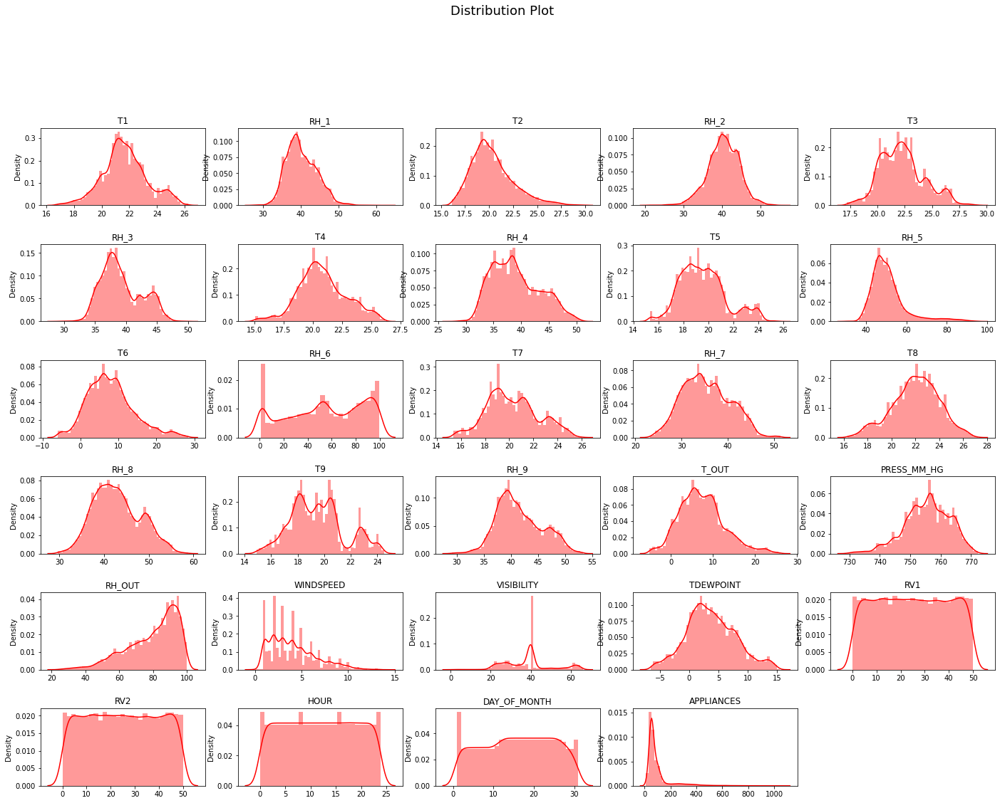

In [23]:
plt.figure(figsize=(24, 20))
plt.suptitle("Distribution Plot", fontsize=18, y=1)

for n, ticker in enumerate(numerical_features +['Appliances']):
    ax = plt.subplot(7, 5, n + 1)
    plt.subplots_adjust(hspace=0.5, wspace=0.2)
    sns.distplot(df[ticker], color='r')
    ax.set_title(ticker.upper())
    ax.set_xlabel("")

Temperature and
Humidity attributes have
a gaussian-like
distribution. The target variable
‘Appliances’ has a
skewed gaussian
distribution indicating a
wide range of outliers
over the 3rd quartile. From above distribution plot we can conclude that variables hour, rv2, day_of_month, appliances, rh6, rv1, T9, T3, windspeed, visibility are not normally distributed. other variables are seems to be normally distributed.

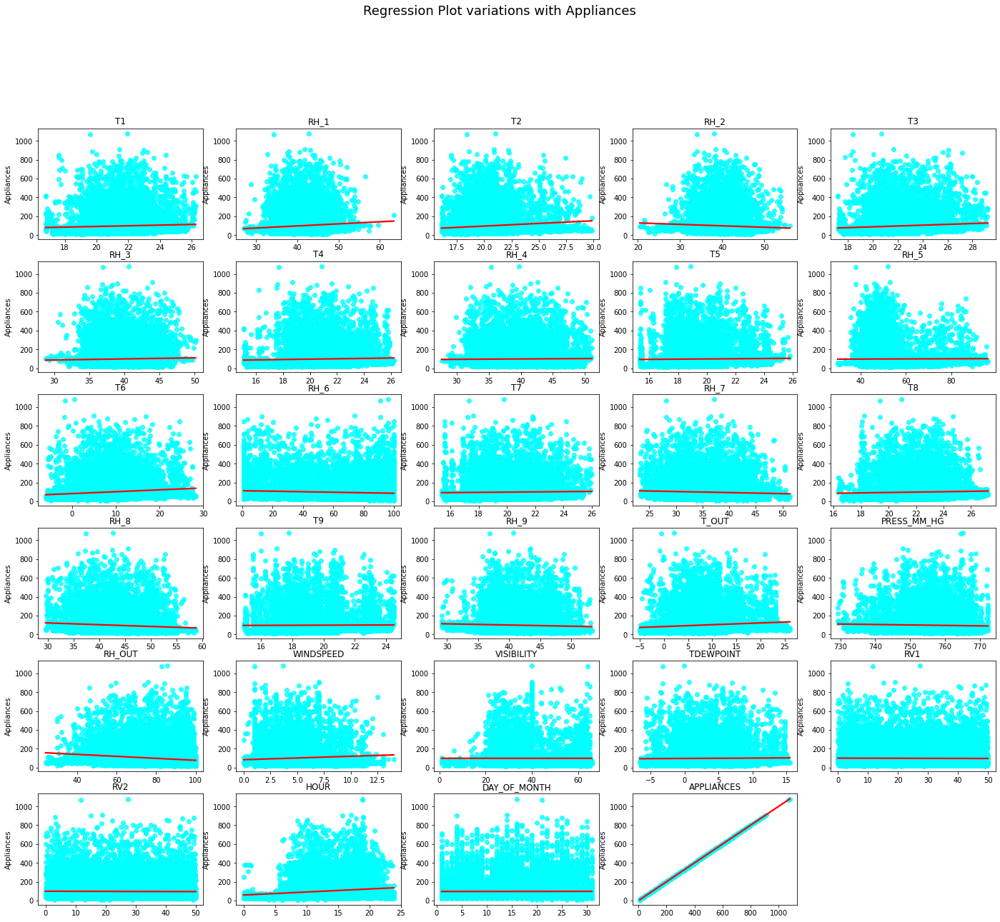

In [24]:
plt.figure(figsize=(24, 20))
plt.suptitle("Regression Plot variations with Appliances ", fontsize=18, y=1)

for n, ticker in enumerate(numerical_features + ['Appliances']):
    ax = plt.subplot(6, 5, n + 1)
    sns.regplot(df[ticker], x='ticker', y=df['Appliances'],  scatter_kws={"color": "cyan"}, line_kws={"color": "red"})
    ax.set_title(ticker.upper())
    ax.set_xlabel("")

as Appliances is our dependent variable hence to find out the pattern of correlation with dependent variable , we have plotted the scatter plot of each variable with dependent variable. 
1. Energy consumption in kitchen area is less as compared to living room area.
2. Energy consumption bathroom, laundry area is more.
3. maximum Energy consumtion is from 12pm to 6pm time period.

#### Q-Q plot

When the quantiles of two variables are plotted against each other, then the plot obtained is known as quantile – quantile plot or qqplot. This plot provides a summary of whether the distributions of two variables are similar or not with respect to the locations.

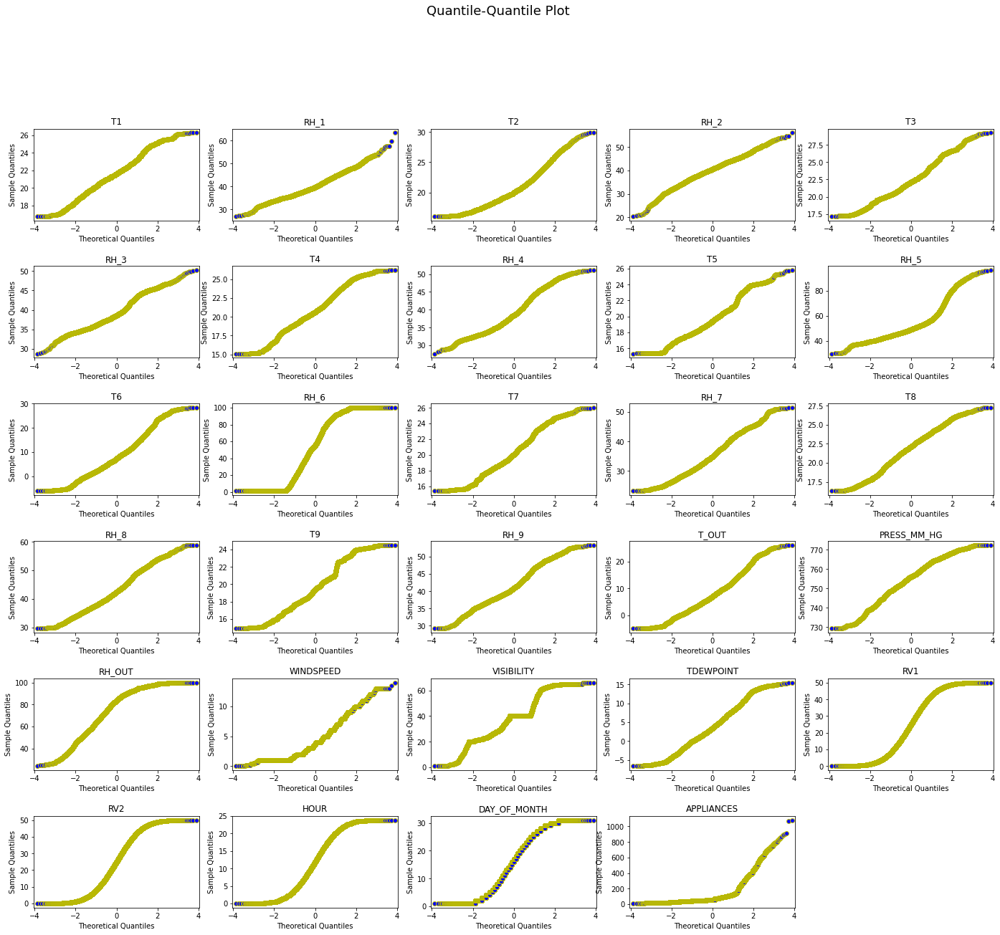

In [25]:
import statsmodels.api as sm
import pylab as py
import scipy.stats as stats

plt.figure(figsize=(24, 20))
plt.suptitle("Quantile-Quantile Plot", fontsize=18, y=1)

for n, ticker in enumerate(numerical_features+ ['Appliances']):
    ax = plt.subplot(6, 5, n + 1)
    plt.subplots_adjust(hspace=0.5, wspace=0.2)
    sm.qqplot(df[ticker] ,color='y', ax = ax)
    ax.set_title(ticker.upper())

The quantile-quantile (q-q) plot is a graphical technique for determining if two data sets come from populations with a common distribution.

There is large variaction in  QQ plot of variables time_of_day, rv2, day_of_month, appliances, rh6, rv1, T9, T3, windspeed, visibility

####Box Plot

#Lets plot BOXPLOT to visualize the outliers in each variables

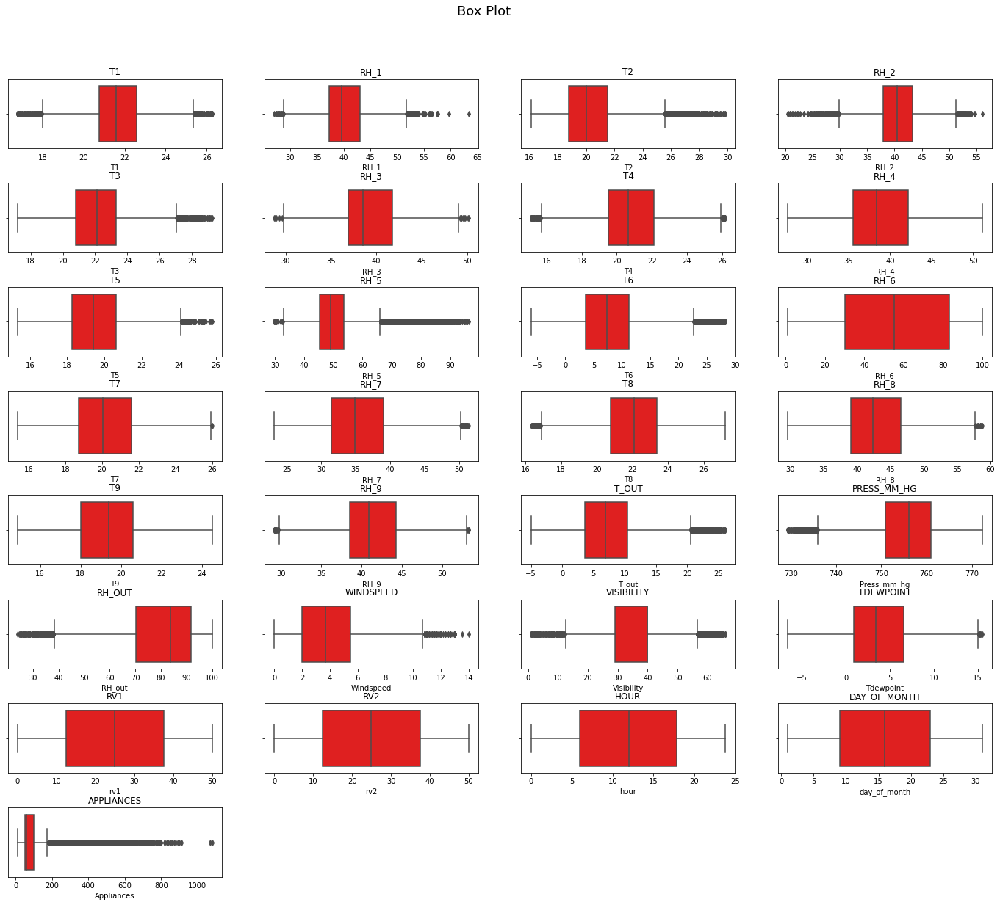

In [26]:

plt.figure(figsize=(24, 20))
plt.suptitle("Box Plot", fontsize=18, y=0.95)

for n, ticker in enumerate(numerical_features+ ['Appliances']):
    
    ax = plt.subplot(8, 4, n + 1)

    plt.subplots_adjust(hspace=0.5, wspace=0.2)
    
    sns.boxplot(df[ticker],color='r', ax = ax)

    # chart formatting
    ax.set_title(ticker.upper())

Most of the appliances consume energy in between 0-200 Wh. We can clearly see that many variables consists of outliers. T1, T2, T3,T4,
T5,T6,T7,T8 and T_OUT
have outliers. RH_1,RH_2,RH_3,RH_5,
RH_7,RH_8,RH_9 and
RH_OUT have outliers
 Windspeed, Tdewpoint,
Visibility and the target
variable Appliances also
have outliers


Text(0.5, 1.0, 'Hourly Day Consumption')

<Figure size 720x360 with 0 Axes>

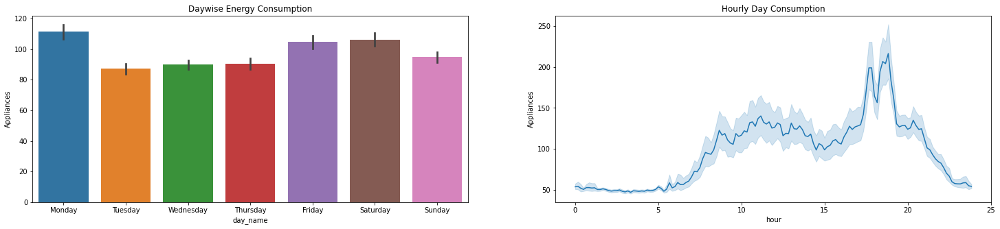

In [27]:
plt.figure(figsize=(10,5))
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(25, 5))
ax = axes.flatten()
sns.barplot(data=df, x='day_name', y='Appliances', ax=ax[0])
sns.lineplot(data=df, x='hour', y='Appliances', ax=ax[1])
ax[0].set_title('Daywise Energy Consumption')
ax[1].set_title('Hourly Day Consumption')

1. Energy consumption on Monday is high, followed by saturday, friday and sunday.
2. Energy consumption from 9am to 8 pm is high. whereas is less in between 12 am to 6am. its maximum at evening.

In [28]:
df.corr()

,Appliances,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,T5,...,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2,hour,day_of_month,day_of_week,month
Appliances,1.000000,0.055447,0.086031,0.120073,-0.060465,0.085060,0.036292,0.040281,0.016965,0.019760,...,-0.152282,0.087122,0.000230,0.015353,-0.011145,-0.011145,0.217152,0.002366,0.003060,-0.011606
T1,0.055447,1.000000,0.164006,0.836834,-0.002509,0.892402,-0.028550,0.877001,0.097861,0.885247,...,-0.345481,-0.087654,-0.076210,0.571309,-0.006203,-0.006203,0.178728,-0.127088,0.001381,0.706305
RH_1,0.086031,0.164006,1.000000,0.269839,0.797535,0.253230,0.844677,0.106180,0.880359,0.205797,...,0.274126,0.204932,-0.021057,0.639106,-0.000699,-0.000699,0.018531,-0.041397,-0.053782,-0.094048
T2,0.120073,0.836834,0.269839,1.000000,-0.165610,0.735245,0.121497,0.762066,0.231563,0.720550,...,-0.505291,0.052495,-0.069721,0.582602,-0.011087,-0.011087,0.254569,-0.156913,0.000602,0.533479
RH_2,-0.060465,-0.002509,0.797535,-0.165610,1.000000,0.137319,0.678326,-0.047304,0.721435,0.110409,...,0.584911,0.069190,-0.005368,0.499152,0.006275,0.006275,-0.183182,0.037117,-0.044249,-0.097914
T3,0.085060,0.892402,0.253230,0.735245,0.137319,1.000000,-0.011234,0.852778,0.122737,0.888169,...,-0.281718,-0.100776,-0.102310,0.645886,-0.005194,-0.005194,0.037607,-0.077190,-0.017514,0.790365
RH_3,0.036292,-0.028550,0.844677,0.121497,0.678326,-0.011234,1.000000,-0.140457,0.898978,-0.050062,...,0.356192,0.263188,0.017041,0.414387,-0.000477,-0.000477,-0.052343,-0.048427,-0.035182,-0.414359
T4,0.040281,0.877001,0.106180,0.762066,-0.047304,0.852778,-0.140457,1.000000,-0.048650,0.871813,...,-0.388602,-0.185747,-0.104768,0.519471,-0.001815,-0.001815,0.088334,-0.121867,-0.091006,0.789168
RH_4,0.016965,0.097861,0.880359,0.231563,0.721435,0.122737,0.898978,-0.048650,1.000000,0.091812,...,0.336813,0.300192,0.002636,0.616509,-0.001787,-0.001787,-0.019040,-0.005404,-0.005749,-0.258167
T5,0.019760,0.885247,0.205797,0.720550,0.110409,0.888169,-0.050062,0.871813,0.091812,1.000000,...,-0.273953,-0.145011,-0.084164,0.588362,-0.005490,-0.005490,0.071282,-0.128832,-0.040827,0.785865


###Categorical Features

Text(0.5, 1.0, 'Daywise Consumption')

<Figure size 720x360 with 0 Axes>

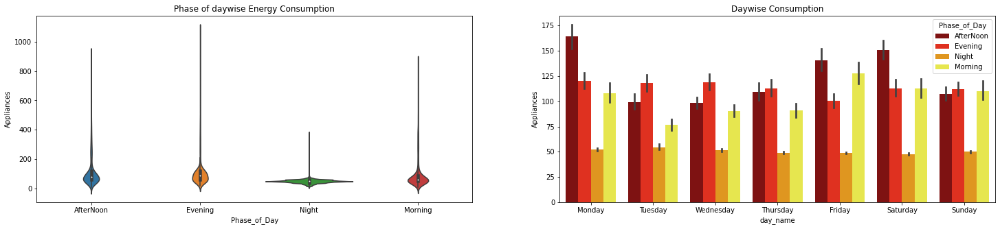

In [29]:
plt.figure(figsize=(10,5))
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(25, 5))
ax = axes.flatten()
sns.violinplot(x='Phase_of_Day', y='Appliances', data =df, ax=ax[0])
sns.barplot(data=df, x='day_name', y='Appliances',hue='Phase_of_Day',palette='hot' ,ax=ax[1])
ax[0].set_title('Phase of daywise Energy Consumption')
ax[1].set_title('Daywise Consumption')

1. Energy consumption at night is less as compared to morning and afternoon on every weekday.
2. Energy consumption is high in the evening. whereas its high on monday, friday and saturday in the afternoon.
3. Most of the appliances consumes around 200 Wh energy.

##Bivariate Analysis

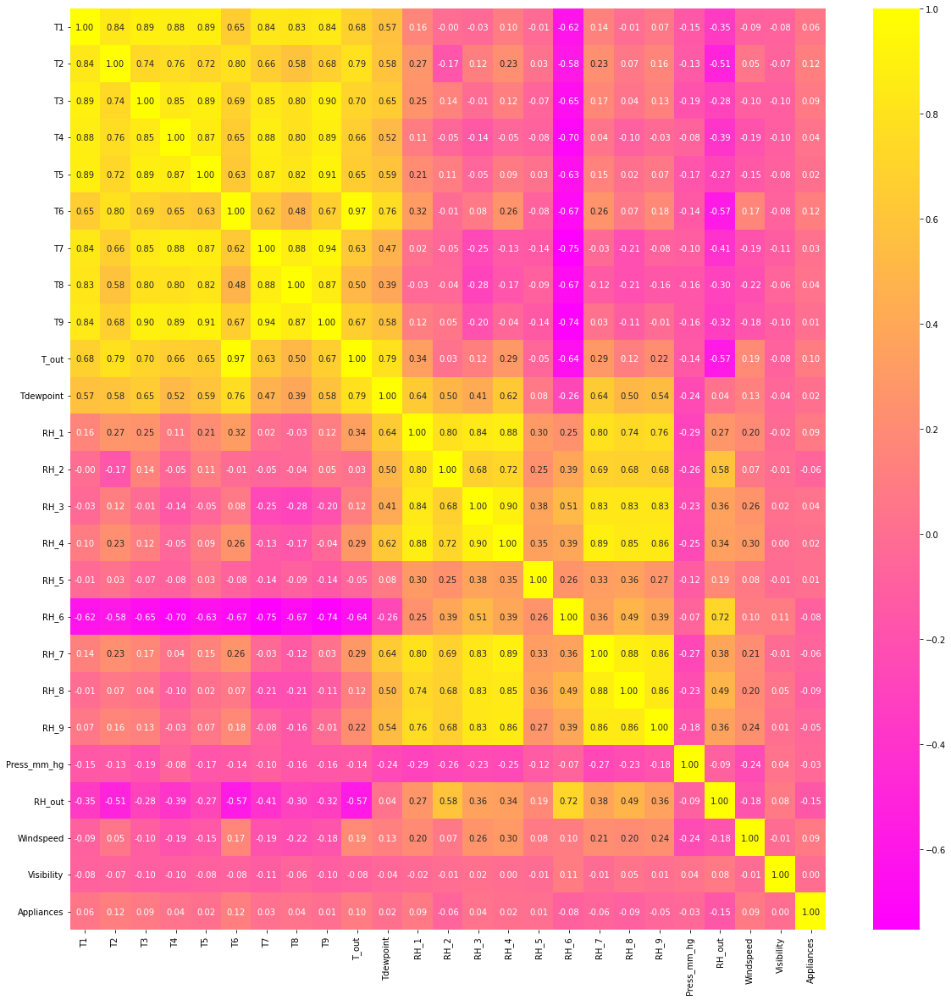

In [30]:
plt.figure(figsize=(20,20))
rhp_cols=['RH_1','RH_2','RH_3','RH_4','RH_5','RH_6','RH_7','RH_8','RH_9','Press_mm_hg','RH_out','Windspeed','Visibility']
rhp=df[rhp_cols]
t_col=['T1','T2','T3','T4','T5','T6','T7','T8','T9','T_out','Tdewpoint']
temp=df[t_col]

sns.heatmap(df[t_col+ rhp_cols+ ['Appliances']].corr(), annot=True, cmap='spring', fmt='.2f')

1. T9 ang T7 are highly correlated as 0.94 
2. T_out and T6 are as 0.97 correlated as 0.97
3. We see strong correlation among
temperature variables as change
in outside heat can be
experienced by all rooms except
when changed only by human
intervention such as use of
thermostat, heaters etc.
4. There is also a strong inverse
correlation observed between
RH_6 and all temperature features.
This is because RH_6 is the
outside humidity.
5. As air temperature increases, air
can hold more water molecules,
and its relative humidity
decreases

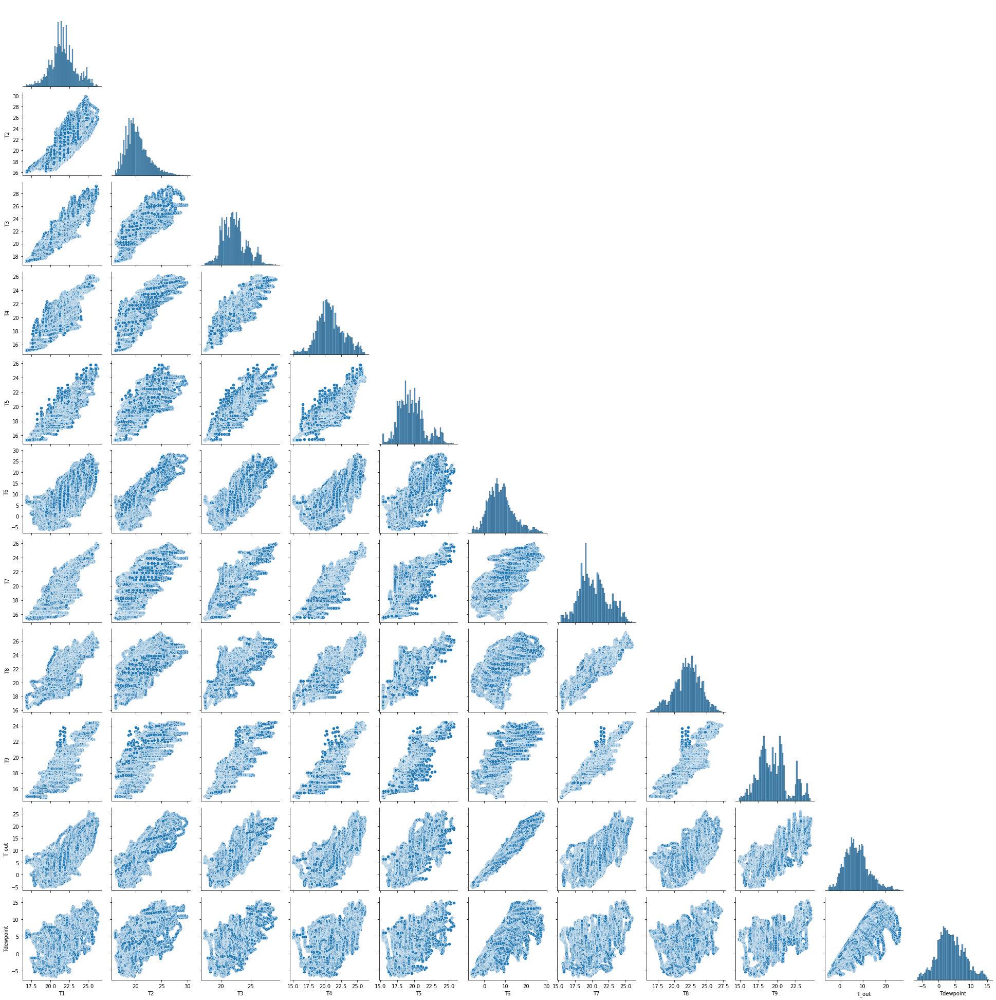

In [31]:
sns.pairplot(temp, palette='rainbow',corner=True)

Almost all Temparature variables are linearly correlated with each other.

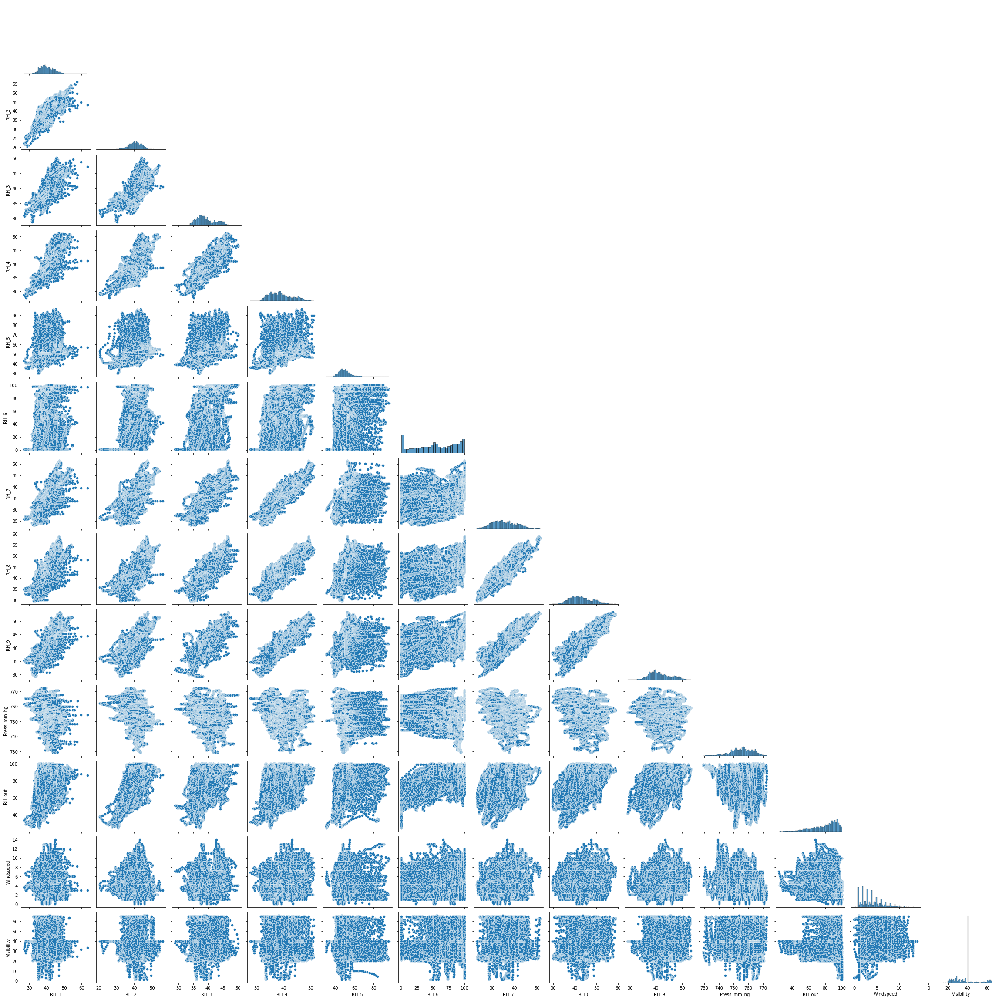

In [32]:

sns.pairplot(rhp, palette='rainbow',corner=True)

Relative Humidity variables except rh5, rh6 are positively correlated with each other. 

Text(0.5, 1.0, 'T9 vs T5 relation')

<Figure size 720x720 with 0 Axes>

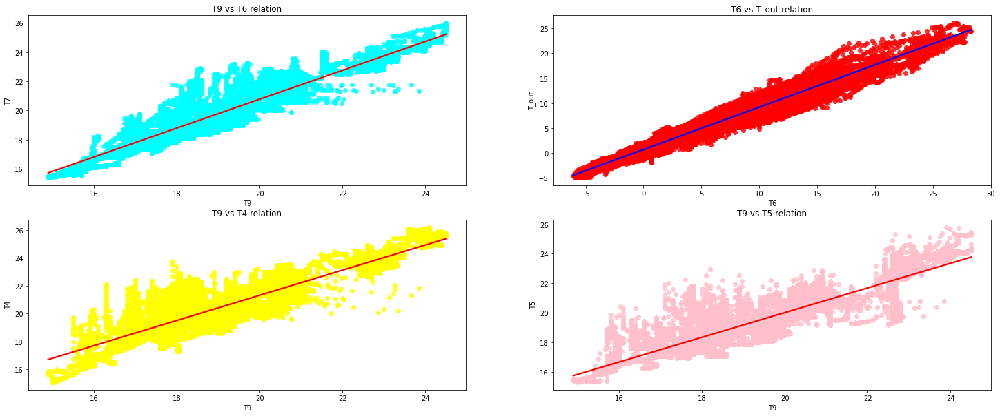

In [33]:
t_col=['T1','T2','T3','T4','T5','T6','T7','T8','T9','T_out','Tdewpoint']
temp=df[t_col]
plt.figure(figsize=(10,10))
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(25, 10))
ax = axes.flatten()
sns.regplot(data=temp, x='T9', y='T7', color='r',scatter_kws={"color": "cyan"}, line_kws={"color": "red"}, ax=ax[0])
sns.regplot(data=temp, x='T6', y='T_out',color='g',scatter_kws={"color": "red"}, line_kws={"color": "blue"}, ax=ax[1])
sns.regplot(data=temp, x='T9', y='T4', color='m',scatter_kws={"color": "yellow"}, line_kws={"color": "red"}, ax=ax[2])
sns.regplot(data=temp, x='T9', y='T5',color='y',scatter_kws={"color": "pink"}, line_kws={"color": "red"}, ax=ax[3])
ax[0].set_title('T9 vs T6 relation')
ax[1].set_title('T6 vs T_out relation')
ax[2].set_title('T9 vs T4 relation')
ax[3].set_title('T9 vs T5 relation')

T9, T5,T4, T_out, T6 are highly correlated which causes multicollinearity, removing either of them can be done to remove multicollinearity. hence T6 and T9 can be removed.

since 'rv1' and 'rv2' have correlation of 1, we can drop either of them.

In [34]:
(df['rv1'] ==df['rv2']).unique()

array([ True])

Since both the features are identical, one of them is eliminated from the dataset

In [35]:
df.drop('rv2', axis = 1, inplace = True)
numerical_features.remove('rv2')

In [36]:
numerical_features

['T1',
 'RH_1',
 'T2',
 'RH_2',
 'T3',
 'RH_3',
 'T4',
 'RH_4',
 'T5',
 'RH_5',
 'T6',
 'RH_6',
 'T7',
 'RH_7',
 'T8',
 'RH_8',
 'T9',
 'RH_9',
 'T_out',
 'Press_mm_hg',
 'RH_out',
 'Windspeed',
 'Visibility',
 'Tdewpoint',
 'rv1',
 'hour',
 'day_of_month']

now lets check, daywise hourly distribution of data over all variables

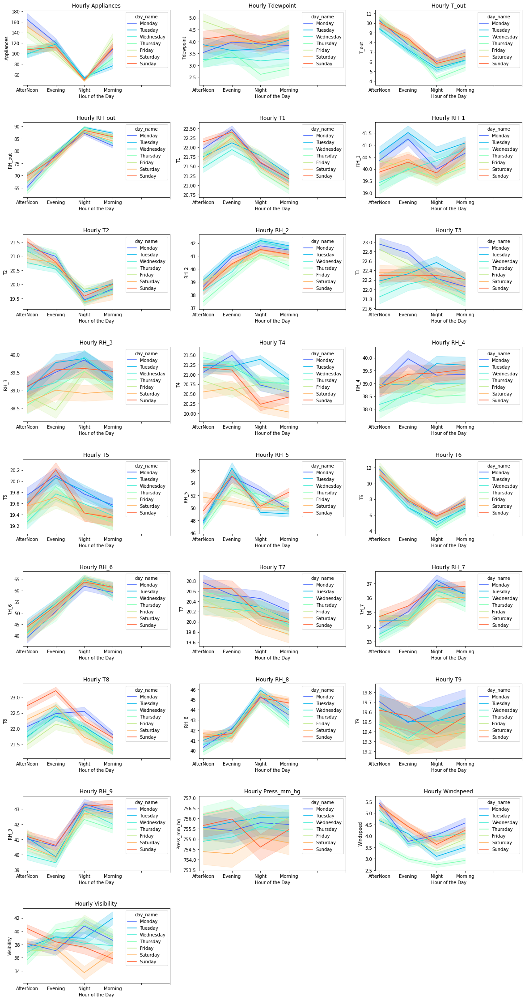

In [37]:
measurements = ['Appliances','Tdewpoint','T_out','RH_out','T1','RH_1','T2','RH_2','T3','RH_3','T4','RH_4','T5','RH_5','T6','RH_6','T7','RH_7','T8','RH_8','T9','RH_9','Press_mm_hg','Windspeed','Visibility',]
plt.figure(figsize=(20, 40))
for n, measurement in enumerate(measurements):
    # add a new subplot iteratively
    ax = plt.subplot(9, 3, n + 1)
    plt.subplots_adjust(hspace=0.5, wspace=0.2)
    sns.lineplot(x= df['Phase_of_Day'], y = df[measurement], hue = df['day_name'] ,palette = 'rainbow', ax = ax)
    plt.xticks(np.arange(0,6,1))
    plt.title(f"Hourly {measurement}")
    plt.xlabel("Hour of the Day")
    plt.ylabel(measurement)
plt.show()


1. Temparature of Kitchen, bathroom, living area, outside the building (north side) and parents room is less in night also Energy consumption of appliances is less during night.
2. Relative Humidity is more at night.

#Feature Engineering and Selection



## Numerical Outliers

Apply a power transform featurewise to make data more Gaussian-like.

Power transforms are a family of parametric, monotonic transformations that are applied to make data more Gaussian-like

In [38]:
#from scipy.stats import zscore

#X = df[numerical_features].apply(zscore)
#X = df[numerical_features]
#y=(df['Appliances'])

<Figure size 432x288 with 0 Axes>

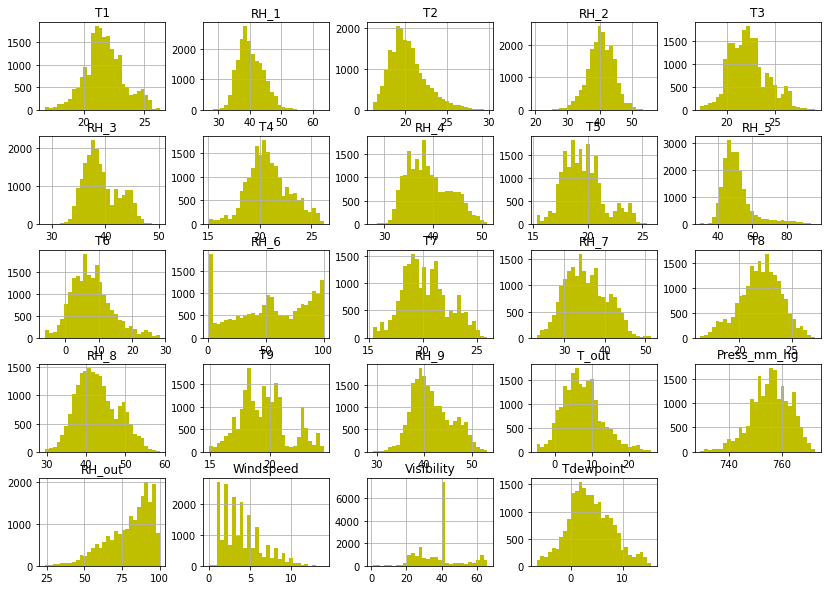

In [39]:
#from sklearn.preprocessing import PowerTransformer
#plt.figure(figsize=(30,30))
# Init
#pt = PowerTransformer()
plt.subplots_adjust(hspace=0.6, wspace=0.6)

#df[numerical_features[:-3]] = pd.DataFrame(pt.fit_transform(df[numerical_features[:-3]]), columns= numerical_features[:-3])

df[numerical_features[:-3]].hist(figsize=(14, 10), bins = 30, color='y');

### Handling Outliers

As discussed in boxplot, many variables are having outliers hence we need to deal with outliers

#### Inter Quantile method

In [40]:

for ftr in numerical_features +['Appliances'] : 
  print(ftr,'\n')
  q25= np.percentile(df[ftr], 25)
  q75 = np.percentile(df[ftr], 75)
  iqr = q75 - q25
  print('Percentiles: 25th=%.3f, 75th=%.3f, IQR=%.3f' % (q25, q75, iqr))
  # calculate the outlier cutoff
  cut_off = iqr * 1.5
  lower = q25 - cut_off
  upper = q75 + cut_off
  print(f"\nlower = {lower} and upper = {upper} \n ")
  # identify outliers
  outliers = [x for x in df[ftr] if x < lower or x > upper]
  print('Identified outliers: %d' % len(outliers))
  #removing outliers
  if len(outliers)!=0:
    
    def bin(row):
      if row[ftr]> upper:
        return upper
      if row[ftr] < lower:
        return lower
      else:
        return row[ftr]
    
    

    df[ftr] =  df.apply (lambda row: bin(row), axis=1)
    print(f"{ftr} Outliers Removed")
  print("\n-------\n")
  
 

T1 

Percentiles: 25th=20.760, 75th=22.600, IQR=1.840

lower = 18.0 and upper = 25.36 
 
Identified outliers: 515
T1 Outliers Removed

-------

RH_1 

Percentiles: 25th=37.333, 75th=43.067, IQR=5.733

lower = 28.733333333333185 and upper = 51.666666666666806 
 
Identified outliers: 146
RH_1 Outliers Removed

-------

T2 

Percentiles: 25th=18.790, 75th=21.500, IQR=2.710

lower = 14.724999999999998 and upper = 25.565 
 
Identified outliers: 546
T2 Outliers Removed

-------

RH_2 

Percentiles: 25th=37.900, 75th=43.260, IQR=5.360

lower = 29.86 and upper = 51.3 
 
Identified outliers: 235
RH_2 Outliers Removed

-------

T3 

Percentiles: 25th=20.790, 75th=23.290, IQR=2.500

lower = 17.04 and upper = 27.04 
 
Identified outliers: 217
T3 Outliers Removed

-------

RH_3 

Percentiles: 25th=36.900, 75th=41.760, IQR=4.860

lower = 29.61 and upper = 49.05 
 
Identified outliers: 15
RH_3 Outliers Removed

-------

T4 

Percentiles: 25th=19.530, 75th=22.100, IQR=2.570

lower = 15.675 and upper =

check (99) Percentile limit for outlier removal

In [41]:
y=df['Appliances']
lower=np.percentile(y, 1)
lower

20.0

In [42]:
upper=np.percentile(y,99)
upper

175.0

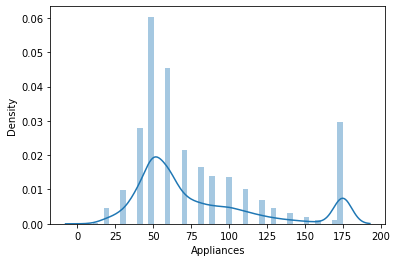

In [43]:
#y= np.where(y >= upper, upper, np.where(y<= lower, lower, y))
sns.distplot(y)

Lets check effect of removing outliers on daily and weekly Energy consumption 

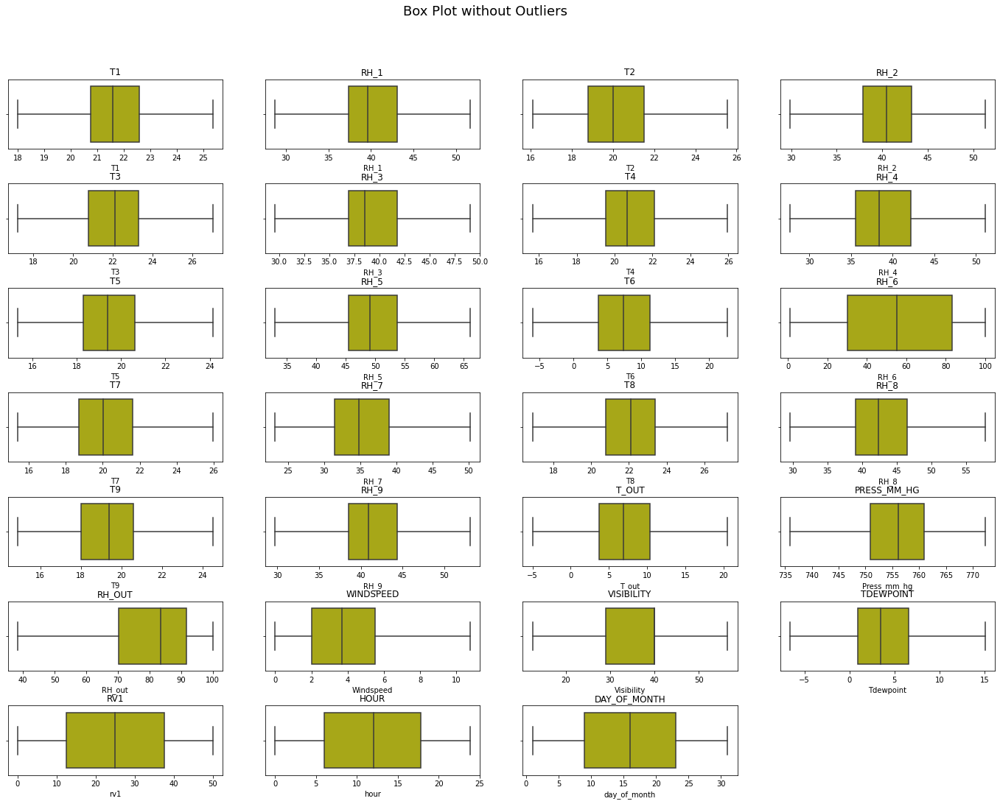

In [44]:

plt.figure(figsize=(24, 20))
plt.suptitle("Box Plot without Outliers", fontsize=18, y=0.95)

for n, ticker in enumerate(numerical_features):
    
    ax = plt.subplot(8, 4, n + 1)

    plt.subplots_adjust(hspace=0.5, wspace=0.2)
    
    sns.boxplot(df[ticker],color='y' ,ax = ax)

    # chart formatting
    ax.set_title(ticker.upper())

# Encoding Categorical Variables

In [45]:

for ftr in categorical_feature:

  one_hot = pd.get_dummies(df[ftr],prefix = ftr, prefix_sep='_')
  df.drop(ftr, inplace = True, axis=1)
  df = df.join(one_hot)
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19735 entries, 0 to 19734
Data columns (total 46 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Appliances              19735 non-null  float64
 1   T1                      19735 non-null  float64
 2   RH_1                    19735 non-null  float64
 3   T2                      19735 non-null  float64
 4   RH_2                    19735 non-null  float64
 5   T3                      19735 non-null  float64
 6   RH_3                    19735 non-null  float64
 7   T4                      19735 non-null  float64
 8   RH_4                    19735 non-null  float64
 9   T5                      19735 non-null  float64
 10  RH_5                    19735 non-null  float64
 11  T6                      19735 non-null  float64
 12  RH_6                    19735 non-null  float64
 13  T7                      19735 non-null  float64
 14  RH_7                    19735 non-null

# **Check** **Multicolinearity**

A variance inflation factor (VIF) is a measure of the amount of multicollinearity in regression analysis. Multicollinearity exists when there is a correlation between multiple independent variables in a multiple regression model. Small VIF values, VIF < 3, indicate low correlation among variables under ideal conditions. The default VIF cutoff value is 5; only variables with a VIF less than 5 will be included in the model. However, note that many sources say that a VIF of less than 10 is acceptable.

In [46]:
X = df.drop(columns=['Appliances'])
#y=np.log10(df['Appliances'])
from scipy.stats import zscore
#Train test split
# numeric_cols = carprice.select_dtypes(include=[np.number]).columns
#X = df[numerical_features].apply(zscore)
y=(df['Appliances'])

X_train, X_test, y_train, y_test = train_test_split(X,y, test_size =0.2,  random_state=5)

In [47]:

#Multicollinearity
from statsmodels.stats.outliers_influence import variance_inflation_factor
def calc_vif(X):

    # Calculating VIF
    vif = pd.DataFrame()
    vif["variables"] = X.columns
    vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

    return(vif)

p=calc_vif(df[[i for i in df.describe().columns]])
q=p.sort_values(by='VIF')
q[:30]

,variables,VIF
25,rv1,1.002533
23,Visibility,1.050752
0,Appliances,1.451404
10,RH_5,1.535222
20,Press_mm_hg,1.562984
27,day_of_month,1.711183
22,Windspeed,1.719500
18,RH_9,7.915778
7,T4,9.933652
16,RH_8,10.337283


# **ANOVA F Value**

The F value is used in analysis of variance (ANOVA). It is calculated by dividing two mean squares. This calculation determines the ratio of explained variance to unexplained variance. 
Image result for anova f value interpretation
The F-value is the ratio of your between group variation and within group variation. A large F-value means the between-group variation is larger than your within-group variation. This can be interpreted to mean there is a statistically significant difference in your group means.

In [48]:
# Import f_classif from Scikit-learn
from sklearn.feature_selection import f_classif

# Create f_classif object to calculate F-value
f_value = f_classif(X, y)
# Print the name and F-value of each feature
for feature in zip(X.describe().columns, f_value[0]):
 print(feature)


('T1', 140.34393981107397)
('RH_1', 17.098359515302164)
('T2', 124.25708898171676)
('RH_2', 26.223946084018916)
('T3', 107.23990665671215)
('RH_3', 31.447808298187873)
('T4', 121.71940616018757)
('RH_4', 10.812088280109425)
('T5', 112.59515734038874)
('RH_5', 7.265619934379211)
('T6', 91.62399231517048)
('RH_6', 105.18228107718463)
('T7', 106.49189885158371)
('RH_7', 25.95641066093464)
('T8', 169.8574476014052)
('RH_8', 69.77797838788631)
('T9', 107.89189099412822)
('RH_9', 55.90803187325997)
('T_out', 80.48352665669616)
('Press_mm_hg', 15.727523978897969)
('RH_out', 107.76574891723901)
('Windspeed', 24.004349112001638)
('Visibility', 1.2802039079701013)
('Tdewpoint', 27.079207716686877)
('rv1', 0.8332502765450418)
('hour', 322.7305069170839)
('day_of_month', 5.884201713078671)
('day_of_week', 6.424058328088866)
('month', 99.56450337550075)
('Phase_of_Day_AfterNoon', 70.89107233097381)
('Phase_of_Day_Evening', 139.16972538561308)
('Phase_of_Day_Morning', 15.71340091985451)
('Phase_of_D

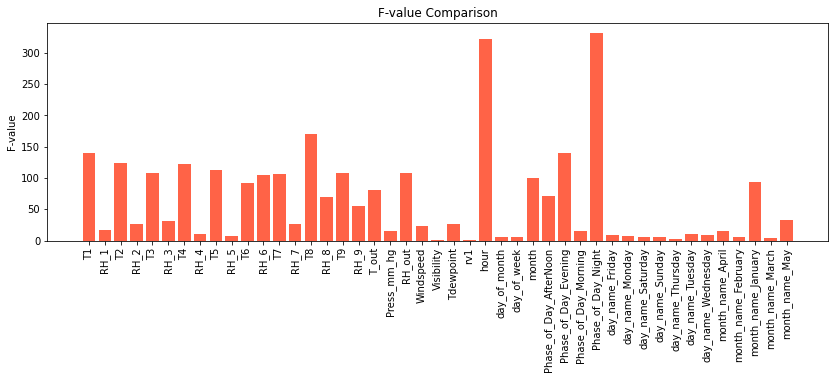

In [49]:
plt.figure(figsize=(14,4))
plt.bar(x= X.describe().columns, height=f_value[0], color='tomato')
plt.xticks(rotation='vertical')
plt.ylabel('F-value')
plt.title('F-value Comparison')
plt.show()


VarianceThreshold is a simple baseline approach to feature selection. It removes all features whose variance doesn't meet some threshold. By default, it removes all zero-variance features, i.e. features that have the same value in all samples.

In [50]:
# Import VarianceThreshold from Scikit-learn
from sklearn.feature_selection import VarianceThreshold
# Create VarianceThreshold object to perform variance thresholding
selector = VarianceThreshold(threshold=0)
# Perform variance thresholding
selector.fit_transform(X)
# Print the name and variance of each feature
for feature in zip(X.describe().columns, selector.variances_):
 print(feature)


('T1', 2.4969370405636986)
('RH_1', 15.542948173296836)
('T2', 4.384097920110066)
('RH_2', 15.860518399206539)
('T3', 3.9319872903228306)
('RH_3', 10.58312388746965)
('T4', 4.143046174232984)
('RH_4', 18.84611000627673)
('T5', 3.3718811447559314)
('RH_5', 33.0533333333332)
('T6', 28.764999999999997)
('RH_6', 98.9)
('T7', 4.45180962419933)
('RH_7', 26.118541956957177)
('T8', 3.8148741595043303)
('RH_8', 27.275724756551316)
('T9', 4.058860320061347)
('RH_9', 17.22586467444447)
('T_out', 25.520833333333368)
('Press_mm_hg', 36.3666666666669)
('RH_out', 61.6666666666668)
('Windspeed', 5.865508223699713)
('Visibility', 44.0)
('Tdewpoint', 17.592207726950175)
('rv1', 49.99120800057426)
('hour', 23.833333333333332)
('day_of_month', 30.0)
('day_of_week', 3.942477050716779)
('month', 1.7933669358164672)
('Phase_of_Day_AfterNoon', 0.18760763033939243)
('Phase_of_Day_Evening', 0.18748099678223165)
('Phase_of_Day_Morning', 0.1874556546652572)
('Phase_of_Day_Night', 0.1874556546652572)
('day_name_Fr

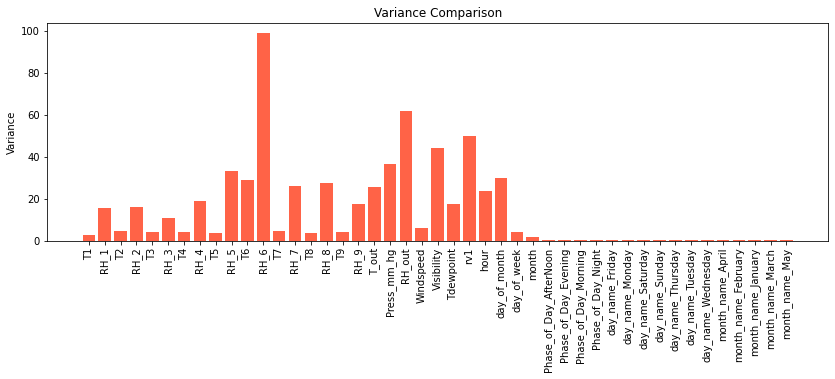

In [51]:
# Create a bar chart for visualizing the variances
plt.figure(figsize=(14,4))
plt.bar(x=X.describe().columns, height=(selector.variances_), color='tomato')
plt.xticks(rotation='vertical')
plt.ylabel('Variance')
plt.title('Variance Comparison')
plt.show()

In [52]:
df.shape

(19735, 46)

In [53]:
df.describe()

,Appliances,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,T5,...,day_name_Saturday,day_name_Sunday,day_name_Thursday,day_name_Tuesday,day_name_Wednesday,month_name_April,month_name_February,month_name_January,month_name_March,month_name_May
count,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,...,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000
mean,78.887256,21.689928,40.249990,20.307042,40.438762,22.259048,39.242344,20.857620,39.026904,19.589014,...,0.138637,0.138637,0.145934,0.145934,0.145934,0.218900,0.211604,0.148062,0.226197,0.195237
std,42.961298,1.580210,3.942554,2.093877,3.982628,1.982974,3.253254,2.035499,4.341321,1.836315,...,0.345576,0.345576,0.353049,0.353049,0.353049,0.413511,0.408456,0.355170,0.418379,0.396393
min,10.000000,18.000000,28.733333,16.100000,29.860000,17.200000,29.610000,15.675000,27.660000,15.330000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,50.000000,20.760000,37.333333,18.790000,37.900000,20.790000,36.900000,19.530000,35.530000,18.277500,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,60.000000,21.600000,39.656667,20.000000,40.500000,22.100000,38.530000,20.666667,38.400000,19.390000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,100.000000,22.600000,43.066667,21.500000,43.260000,23.290000,41.760000,22.100000,42.156667,20.619643,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,175.000000,25.360000,51.666667,25.565000,51.300000,27.040000,49.050000,25.955000,51.090000,24.132857,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


## **Developing Machine Learning Model**

1. Collecting Data: As you know, machines initially learn from the data that you give them. 
2. Preparing the Data.
3. Choosing a Model 
4. Training the Model
5. Evaluating the Model
6. Hyper Parameter Tuning
7. Making Predictions.
8. Model Explanability

###Train Test Split

In [54]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler

In [55]:
numerical_features = [ 'T1', 'RH_1', 'T2', 'RH_2', 'T3', 'RH_3', 'T4', 'RH_4',
       'T5', 'RH_5', 'RH_6', 'T7', 'RH_7', 'T8', 'RH_8','RH_9',
       'T_out', 'Press_mm_hg', 'RH_out', 'Windspeed', 'Visibility',
       'Tdewpoint', 'rv1', 'rv2', 'hour', 'day_of_month']

In [56]:
X = df.drop(columns=['Appliances','T6','day_of_week','T9'])
#y=np.log10(df['Appliances'])
from scipy.stats import zscore
#Train test split
# numeric_cols = carprice.select_dtypes(include=[np.number]).columns
#X = df[numerical_features].apply(zscore)
y=(df['Appliances'])

X_train, X_test, y_train, y_test = train_test_split(X,y, test_size =0.2,  random_state= 5)

In [57]:
y.shape

(19735,)

In [58]:
X_train.columns

Index(['T1', 'RH_1', 'T2', 'RH_2', 'T3', 'RH_3', 'T4', 'RH_4', 'T5', 'RH_5',
       'RH_6', 'T7', 'RH_7', 'T8', 'RH_8', 'RH_9', 'T_out', 'Press_mm_hg',
       'RH_out', 'Windspeed', 'Visibility', 'Tdewpoint', 'rv1', 'hour',
       'day_of_month', 'month', 'Phase_of_Day_AfterNoon',
       'Phase_of_Day_Evening', 'Phase_of_Day_Morning', 'Phase_of_Day_Night',
       'day_name_Friday', 'day_name_Monday', 'day_name_Saturday',
       'day_name_Sunday', 'day_name_Thursday', 'day_name_Tuesday',
       'day_name_Wednesday', 'month_name_April', 'month_name_February',
       'month_name_January', 'month_name_March', 'month_name_May'],
      dtype='object')

In [59]:
y_train

11121     50.0
18031     90.0
14872     60.0
17070     60.0
5227      60.0
         ...  
1032     175.0
5520      30.0
3046      70.0
18638     50.0
2915      30.0
Name: Appliances, Length: 15788, dtype: float64

# **Scaling Dataset**

Python sklearn library offers us with StandardScaler() function to standardize the data values into a standard format. According to the above syntax, we initially create an object of the StandardScaler() function. Further, we use fit_transform() along with the assigned object to transform the data and standardize it.

In [60]:
def do_scale(X_train, X_test, scaling_type = StandardScaler):
  scaler = scaling_type()
  scaler.fit(X_train)
  X_train_scaled = pd.DataFrame(scaler.transform(X_train), columns = X_train.columns)
  X_test_scaled = pd.DataFrame(scaler.transform(X_test), columns = X_test.columns)
  return X_train_scaled, X_test_scaled


In [61]:
X_train_scaled, X_test_scaled = do_scale(X_train,X_test)

In [62]:
X_train_scaled.shape, X_test_scaled.shape

((15788, 42), (3947, 42))

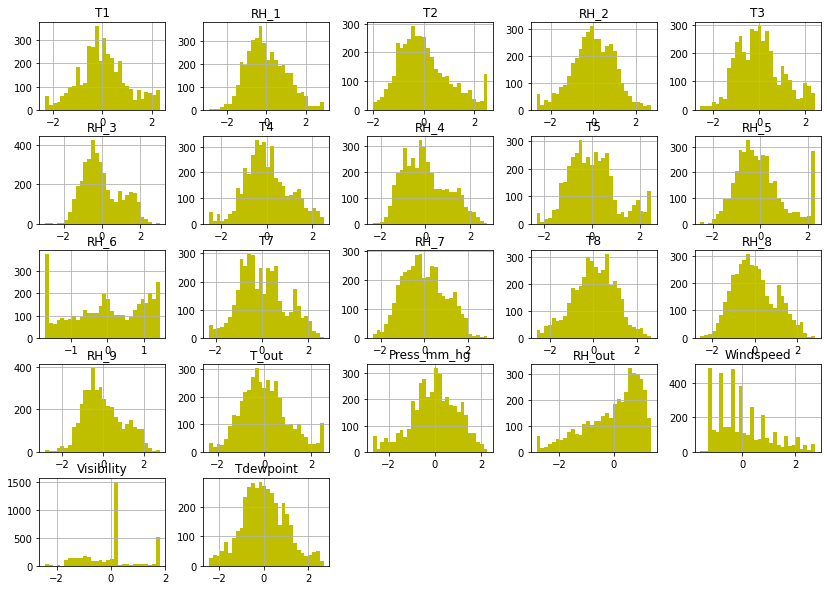

In [63]:
X_test_scaled[numerical_features[:-4]].hist(figsize=(14, 10), bins = 30, color='y');

##**Functions used for Developing ML Model**

In [64]:
from sklearn.metrics import mean_absolute_error, r2_score, mean_squared_error, max_error  #model evaluation metrics
from sklearn.linear_model import  LinearRegression, Lasso, Ridge 
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR, LinearSVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.datasets import make_regression
from sklearn.ensemble import AdaBoostRegressor, BaggingRegressor, GradientBoostingRegressor, RandomForestRegressor, VotingRegressor, StackingRegressor,ExtraTreesRegressor
from sklearn.model_selection import KFold        #k folds cross validation
from sklearn.model_selection import cross_val_score  #for cross validation
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV  #hyperparameter tuning
from xgboost import XGBRegressor

In [65]:
def get_features_importance (optimal_model,X_train_scaled):
  '''
  shows the graph of feature importance
  '''
  features = X_train.columns
  importances = optimal_model.feature_importances_
  indices = np.argsort(importances)

  plt.figure(figsize=(15,10))
  plt.title('Feature Importance')
  plt.barh(range(len(indices)), importances[indices], color='red', align='center')
  plt.yticks(range(len(indices)), [features[i] for i in indices])
  plt.xlabel('Relative Importance')

  plt.show()

In [66]:
report = {
    'model_type':[],
    'model_name':[],
    'test_mse':[],
    'test_rmse':[],
    'test_mae':[],
    'test_R2':[],
    'test_adjusted R2':[],
    'training_R2':[],
    
    #'training_rmse':[],
    #'training_mae':[],
    
    #'training_adjusted_R2':[]

   }

In [67]:

# function to evaluate and update model and score
def evaluate(modeltype, modelname, Model, X_train, y_train, X_test, y_test):
  from sklearn.metrics import mean_absolute_error, r2_score, mean_squared_error, max_error

  if modelname in report['model_name']:
    print("Prexisting Model")
    return 0
  X_tr = X_train_scaled.copy()
  X_te = X_test_scaled.copy()

  print(f"-------\nTraining {str(Model)} ...")
  Model.fit(X_tr, (y_train))

  print(f"\nPredicting{str(Model)} scores ...")

  y_pred = Model.predict(X_te)
  y_pred_train= Model.predict(X_tr)

  test_mae = mean_absolute_error((y_test),(y_pred))
  report['test_mae'].append(test_mae)


  test_R2 = r2_score((y_test), (y_pred))
  report['test_R2'].append(test_R2)

  training_R2= r2_score((y_train), (y_pred_train))
  report['training_R2'].append(training_R2)

  test_mse = (mean_squared_error(y_test,y_pred))
  report['test_mse'].append(test_mse)

  #training_rmse = np.sqrt(mean_squared_error(y_train,y_pred_train))
  #report['training_rmse'].append(training_rmse)

  test_rmse = np.sqrt(mean_squared_error(y_test,y_pred))
  report['test_rmse'].append(test_rmse)

  test_adj_r2=1-(1-r2_score((y_test), (y_pred)))*((X_test_scaled.shape[0]-1)/(X_test_scaled.shape[0]-X_test_scaled.shape[1]-1))
  report['test_adjusted R2'].append(test_adj_r2)

  #training_adjusted_R2=1-(1-r2_score((y_train), (y_pred_train)))*((X_train_scaled.shape[0]-1)/(X_train_scaled.shape[0]-X_train_scaled.shape[1]-1))
  #report['training_adjusted_R2'].append(training_adjusted_R2)

  report['model_name'].append(modelname)
  report['model_type'].append(modeltype)

  
  
  plt.figure(figsize=(20,7))
  plt.plot(((y_pred)[100:150]))
  plt.plot((np.array((y_test))[100:150]))
  plt.legend(["Predicted","Actual"])
  plt.title(modelname)
  plt.show()



  print(f"\nReport Updated\n----------\n")




In [68]:
#displays report in a dataframe
def display_report():
  return pd.DataFrame(report)

In [69]:
def get_models():
  models, names, model_type = list(), list(), list()

  # LinearReg
  models.append(LinearRegression())
  names.append('Linear Regression')
  model_type.append('Linear')

  #Lasso
  models.append(Lasso(alpha =0.0001))
  names.append('Lasso Regression')
  model_type.append('Linear')

  #Ridge
  models.append(Ridge(alpha =10))
  names.append('Ridge Regression')
  model_type.append('Linear')

  #AdaBoostRegressor
  models.append(AdaBoostRegressor())
  names.append('AdaBoostRegressor')
  model_type.append('Ensemble Method')


  # DecisionTree
  models.append((DecisionTreeRegressor()))
  names.append('DecisionTree Regressor')
  model_type.append('Tree')

  #RandomForest
  models.append(RandomForestRegressor())
  names.append('RandomForest Regressor')
  model_type.append('Ensemble Method')


  # GradientBoosting
  models.append(GradientBoostingRegressor(random_state=5))
  names.append('GradientBoosting Regressor')
  model_type.append('Ensemble Method')

  #ExtraTreesRegressor
  models.append(ExtraTreesRegressor())
  names.append('ExtraTreesRegressor')
  model_type.append('Ensemble Method')

   #XGBRegressor
  models.append(XGBRegressor(n_estimators=1000, max_depth=80, eta=0.1, subsample=0.7, colsample_bytree=0.8))
  names.append('XGBRegressor')
  model_type.append('Ensemble Method')

  #Bagging
  models.append(BaggingRegressor())
  names.append('Bagging Regressor')
  model_type.append('Ensemble Method')

   #MLP   
  models.append(MLPRegressor(hidden_layer_sizes=(100,), activation='relu', solver='adam', alpha=0.0001, batch_size='auto', learning_rate='constant', learning_rate_init=0.001, power_t=0.5, max_iter=200, shuffle=True, random_state=None, tol=0.0001, verbose=False, warm_start=False, momentum=0.9, nesterovs_momentum=True, early_stopping=False, validation_fraction=0.1, beta_1=0.9, beta_2=0.999, epsilon=1e-08, n_iter_no_change=10, max_fun=15000))
  names.append('MLPRegressor')
  model_type.append('NN Method')

  # KNN
  models.append(KNeighborsRegressor(algorithm='auto', leaf_size=80, metric='minkowski',metric_params=None, n_jobs=None, n_neighbors=5, p=2, weights='uniform'))
  names.append('K Neighbors Regressor')
  model_type.append('Neighbours')

  #Linear SVM
  models.append(SVR(kernel='linear'))
  names.append('SVR')
  model_type.append('SVM')
  
  return models, names, model_type

##Random Variable Evaluation

As random variables are not playing any kind of role in Energy Prediction, It  is recommended to remove them.

In [70]:
X_train_scaled.drop('rv1', axis =1, inplace = True)
X_test_scaled.drop('rv1', axis =1, inplace = True)
#X_train.drop('rv1', axis =1, inplace = True)
#X_test.drop('rv1', axis =1, inplace = True)

## Inspecting ML Models

-------
Training LinearRegression() ...

PredictingLinearRegression() scores ...


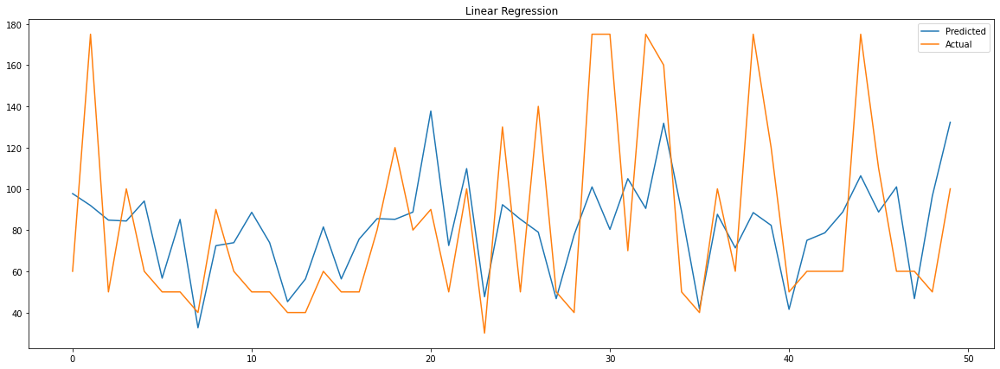


Report Updated
----------

-------
Training Lasso(alpha=0.0001) ...

PredictingLasso(alpha=0.0001) scores ...


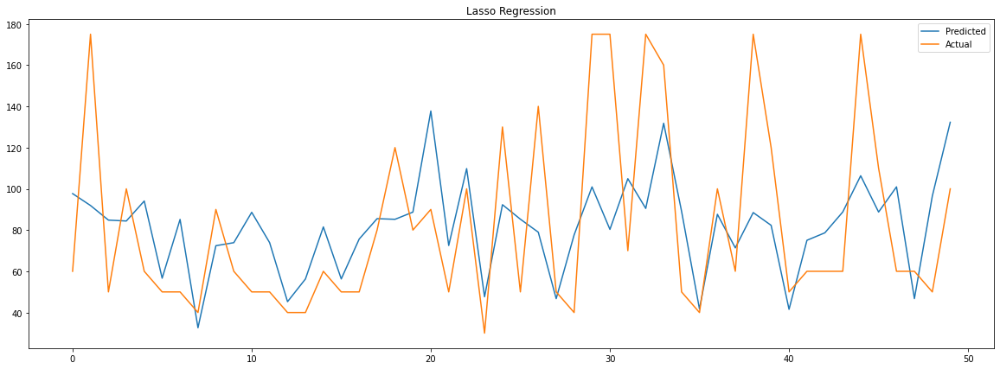


Report Updated
----------

-------
Training Ridge(alpha=10) ...

PredictingRidge(alpha=10) scores ...


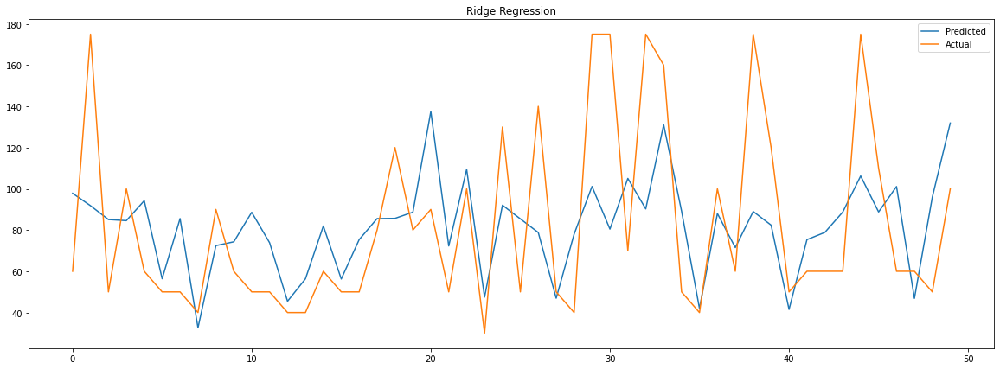


Report Updated
----------

-------
Training AdaBoostRegressor() ...

PredictingAdaBoostRegressor() scores ...


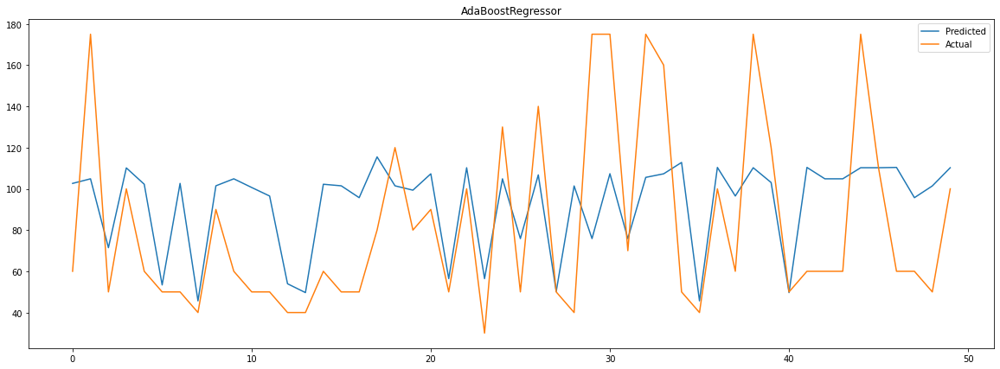


Report Updated
----------

-------
Training DecisionTreeRegressor() ...

PredictingDecisionTreeRegressor() scores ...


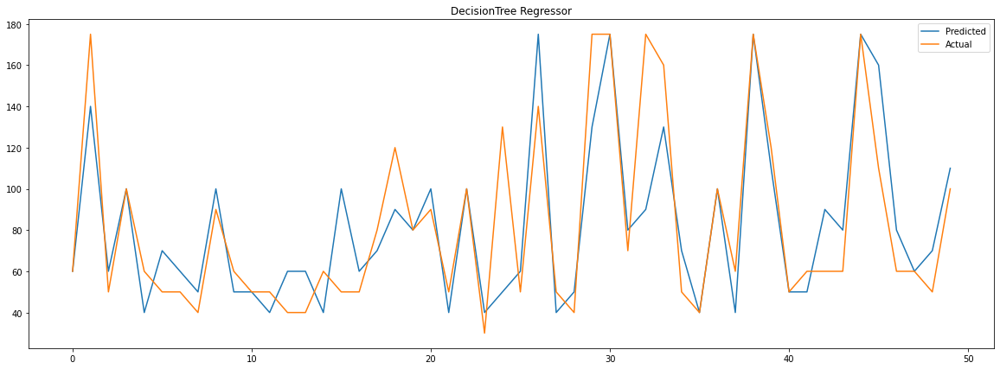


Report Updated
----------

-------
Training RandomForestRegressor() ...

PredictingRandomForestRegressor() scores ...


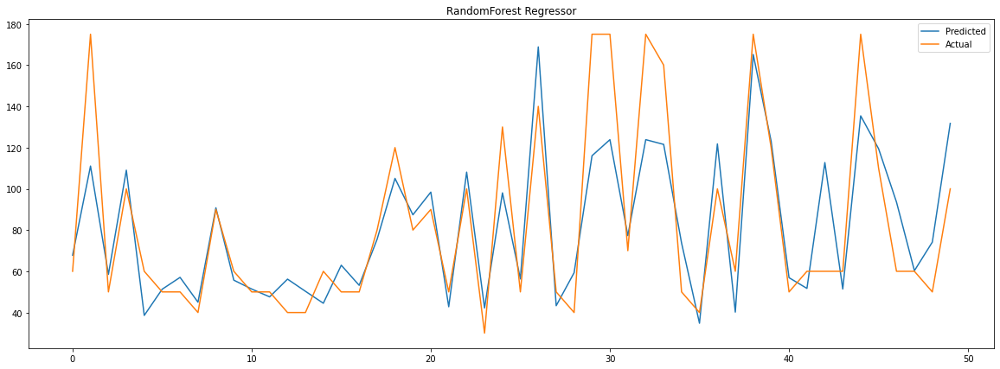


Report Updated
----------

-------
Training GradientBoostingRegressor(random_state=5) ...

PredictingGradientBoostingRegressor(random_state=5) scores ...


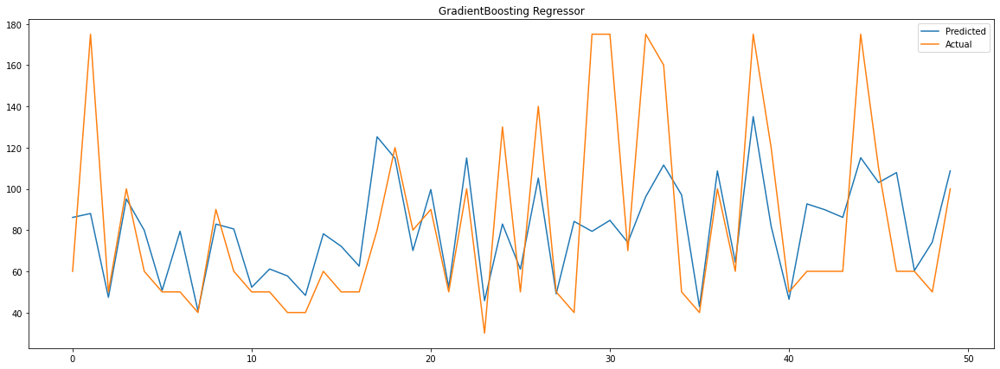


Report Updated
----------

-------
Training ExtraTreesRegressor() ...

PredictingExtraTreesRegressor() scores ...


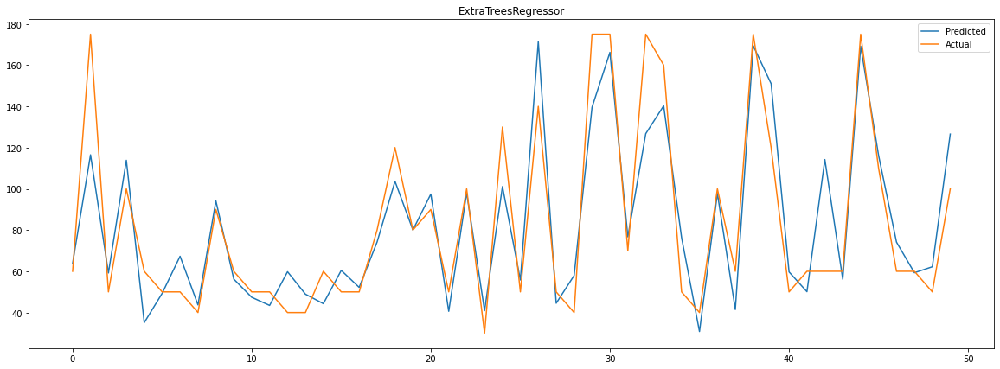


Report Updated
----------

-------
Training XGBRegressor(colsample_bytree=0.8, eta=0.1, max_depth=80, n_estimators=1000,
             subsample=0.7) ...
[06:20:36] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.

PredictingXGBRegressor(colsample_bytree=0.8, eta=0.1, max_depth=80, n_estimators=1000,
             subsample=0.7) scores ...


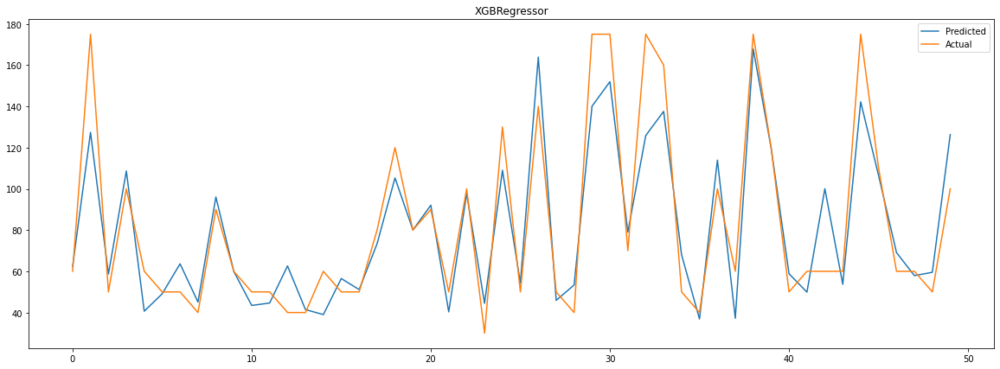


Report Updated
----------

-------
Training BaggingRegressor() ...

PredictingBaggingRegressor() scores ...


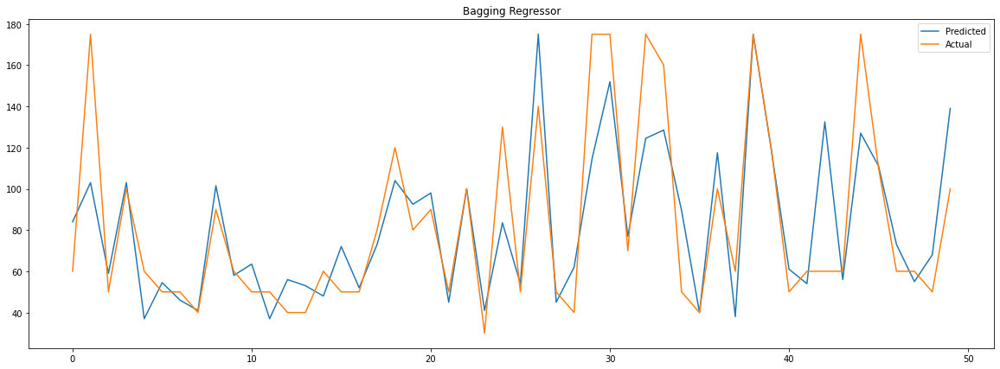


Report Updated
----------

-------
Training MLPRegressor() ...

PredictingMLPRegressor() scores ...


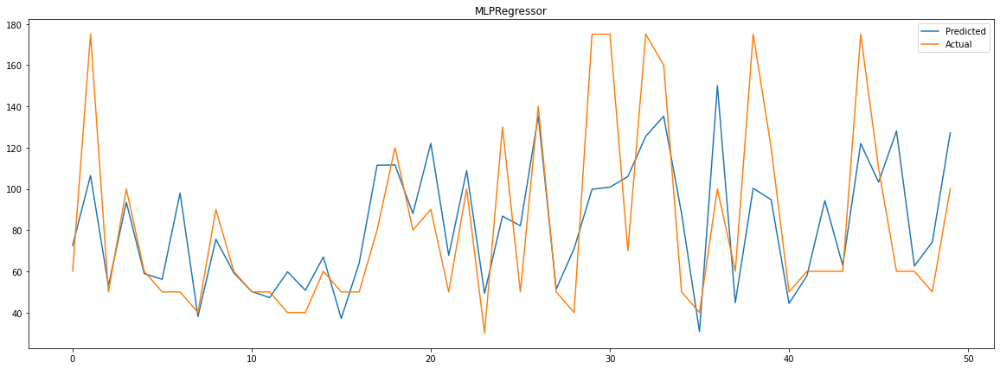


Report Updated
----------

-------
Training KNeighborsRegressor(leaf_size=80) ...

PredictingKNeighborsRegressor(leaf_size=80) scores ...


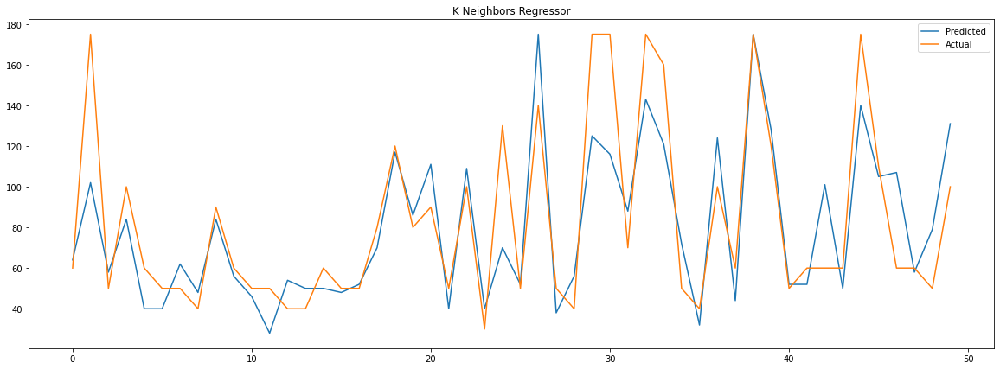


Report Updated
----------

-------
Training SVR(kernel='linear') ...

PredictingSVR(kernel='linear') scores ...


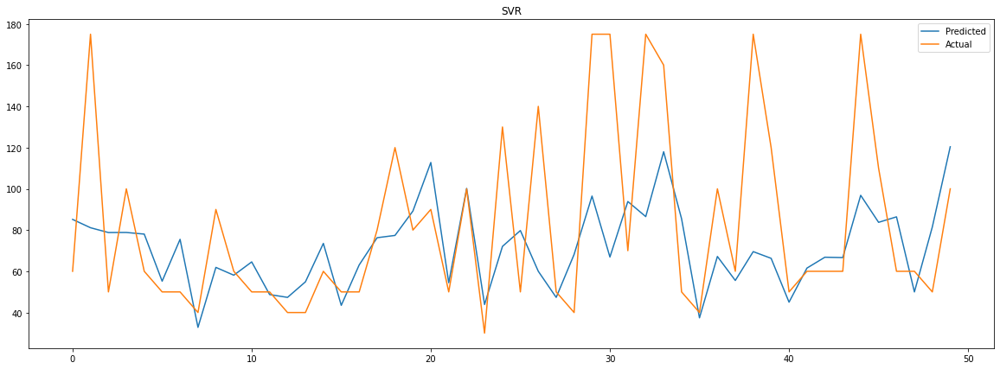


Report Updated
----------



In [71]:
Model, modelname, modeltype = get_models()
for i in range(len(Model)):
  evaluate(modeltype[i], modelname[i], Model[i], X_train , y_train, X_test, y_test)

# Results 

In [72]:
display_report()

,model_type,model_name,test_mse,test_rmse,test_mae,test_R2,test_adjusted R2,training_R2
0,Linear,Linear Regression,1360.106641,36.879624,27.660606,0.282230,0.274693,0.303539
1,Linear,Lasso Regression,1360.115140,36.879739,27.660610,0.282225,0.274689,0.303539
2,Linear,Ridge Regression,1360.833017,36.889470,27.664881,0.281846,0.274306,0.303503
3,Ensemble Method,AdaBoostRegressor,1477.036520,38.432233,30.576317,0.220522,0.212338,0.224812
4,Tree,DecisionTree Regressor,799.119584,28.268703,15.833544,0.578280,0.573852,1.000000
5,Ensemble Method,RandomForest Regressor,447.696612,21.158842,14.015341,0.763737,0.761256,0.965682
6,Ensemble Method,GradientBoosting Regressor,1024.710152,32.011094,22.952282,0.459229,0.453551,0.503818
7,Ensemble Method,ExtraTreesRegressor,399.899716,19.997493,12.890258,0.788961,0.786745,1.000000
8,Ensemble Method,XGBRegressor,416.246358,20.402116,13.215798,0.780334,0.778028,1.000000
9,Ensemble Method,Bagging Regressor,485.562072,22.035473,14.524196,0.743754,0.741063,0.950066


Spot-checking is a way
of discovering which algorithms
perform well on the machine
learning problem

RandomForest Regressor has the lowest mae, rmse and highest R2 score. so we can say that it is best fitted model



#HyperParameter Tuning of best Fitted Model based on R2 Score

In [73]:
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

In [74]:
X_train_scaled, X_test_scaled = do_scale(X_train,X_test)

In [75]:
seed=5
param_grid = param_grid = { 'bootstrap': [True, False], 
                          'max_depth': [80,100, None],
                          'criterion' :['squared_error'],
                          'max_features': ['log2', 'sqrt'], 
                          'n_estimators': [10,1000,100]}
random_forest = ExtraTreesRegressor(random_state=seed)
kfold = KFold(n_splits= 10)
search = RandomizedSearchCV(estimator= random_forest, param_distributions = param_grid, scoring='r2', n_jobs = -1, verbose = 10)
search_result = search.fit(X_train_scaled, y_train)
search_result

Fitting 5 folds for each of 10 candidates, totalling 50 fits


RandomizedSearchCV(estimator=ExtraTreesRegressor(random_state=5), n_jobs=-1,
                   param_distributions={'bootstrap': [True, False],
                                        'criterion': ['squared_error'],
                                        'max_depth': [80, 100, None],
                                        'max_features': ['log2', 'sqrt'],
                                        'n_estimators': [10, 1000, 100]},
                   scoring='r2', verbose=10)

In [76]:
search_result.best_params_ , search_result.best_score_

({'n_estimators': 1000,
  'max_features': 'sqrt',
  'max_depth': 80,
  'criterion': 'squared_error',
  'bootstrap': False},
 0.7455214226884088)

-------
Training ExtraTreesRegressor(max_depth=100, max_features='sqrt', n_estimators=1000,
                    random_state=42) ...

PredictingExtraTreesRegressor(max_depth=100, max_features='sqrt', n_estimators=1000,
                    random_state=42) scores ...


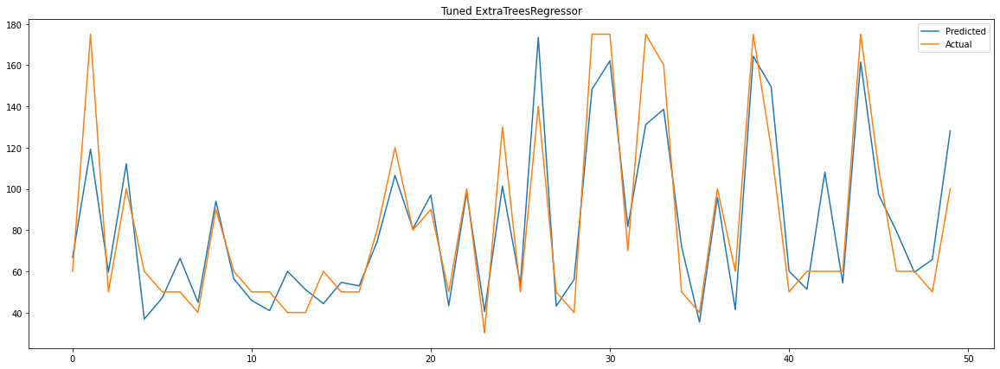


Report Updated
----------

[0.75385572 0.79250993 0.76502018 0.77368611 0.76090932 0.75872295
 0.74577886 0.74779777 0.75675452 0.76883555]


,model_type,model_name,test_mse,test_rmse,test_mae,test_R2,test_adjusted R2,training_R2
0,Linear,Linear Regression,1360.106641,36.879624,27.660606,0.282230,0.274693,0.303539
1,Linear,Lasso Regression,1360.115140,36.879739,27.660610,0.282225,0.274689,0.303539
2,Linear,Ridge Regression,1360.833017,36.889470,27.664881,0.281846,0.274306,0.303503
3,Ensemble Method,AdaBoostRegressor,1477.036520,38.432233,30.576317,0.220522,0.212338,0.224812
4,Tree,DecisionTree Regressor,799.119584,28.268703,15.833544,0.578280,0.573852,1.000000
5,Ensemble Method,RandomForest Regressor,447.696612,21.158842,14.015341,0.763737,0.761256,0.965682
6,Ensemble Method,GradientBoosting Regressor,1024.710152,32.011094,22.952282,0.459229,0.453551,0.503818
7,Ensemble Method,ExtraTreesRegressor,399.899716,19.997493,12.890258,0.788961,0.786745,1.000000
8,Ensemble Method,XGBRegressor,416.246358,20.402116,13.215798,0.780334,0.778028,1.000000
9,Ensemble Method,Bagging Regressor,485.562072,22.035473,14.524196,0.743754,0.741063,0.950066


In [77]:
tuned_ExtraTreesRegressor = ExtraTreesRegressor(n_estimators=1000, max_depth=80 ,criterion='squared_error', max_features='sqrt',random_state=42,  bootstrap=False)
evaluate("Ensemble Method", "Tuned ExtraTreesRegressor", tuned_ExtraTreesRegressor , X_train_scaled , y_train, X_test_scaled,y_test)
print(cross_val_score(tuned_ExtraTreesRegressor, X_train_scaled, y_train, cv=10))
display_report()

#Model Explainability

Model explainability refers to the concept of being able to understand the machine learning model
Importance: Feature
Importance refers to techniques that
assign a score to input features based
on how useful they are at predicting
a target variable.
Feature importance scores provide
insight into the data and the deployed
model.

By looking at the Feature Importance
graphs and the contribution chart
from ELI5, we can gather that the
appliance energy consumption
largely depends on the 'hour'
, 'phase of day night' and temperatures in rooms 2, 3 and
8.

##Feature Importance

In [78]:
def get_features_importance (optimal_model,X_train):
  '''
  shows the graph of feature importance
  '''
  features = X_train.columns
  importances = optimal_model.feature_importances_
  indices = np.argsort(importances)

  plt.figure(figsize=(15,15))
  plt.title('Feature Importance')
  plt.barh(range(len(indices)), importances[indices], color='m', align='center')
  plt.yticks(range(len(indices)), [features[i] for i in indices])
  plt.xlabel('Relative Importance')

  plt.show()

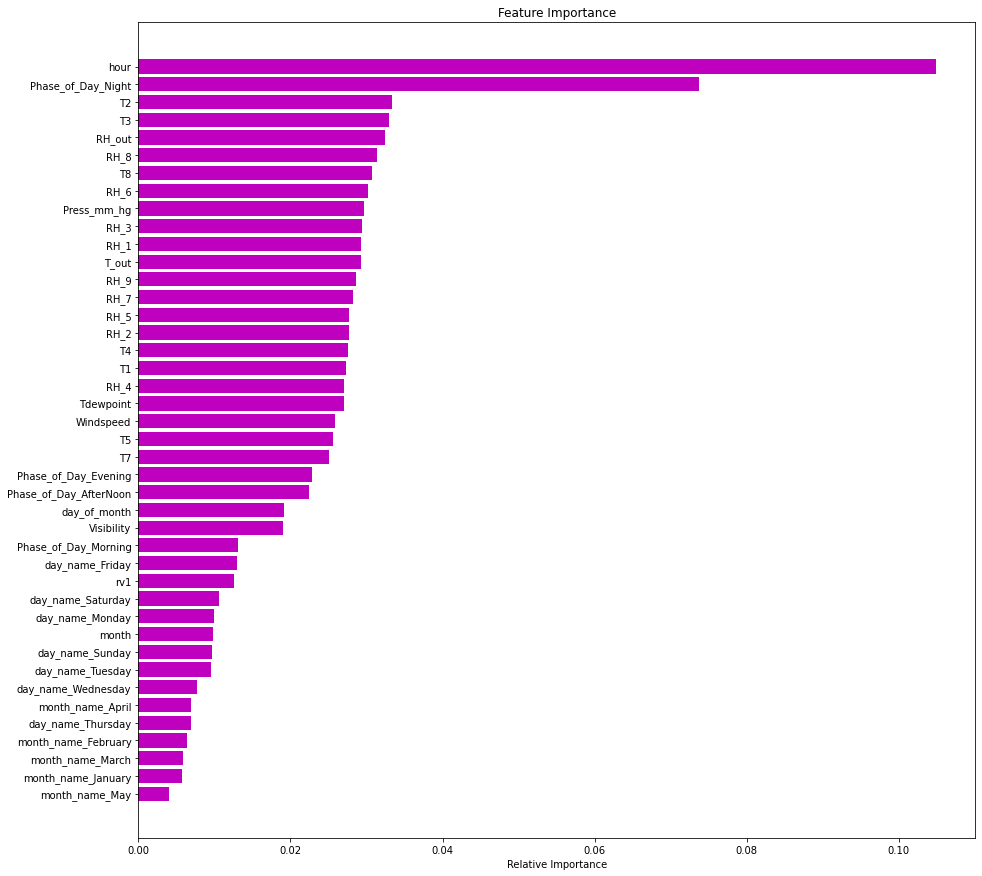

In [79]:
# Getting features importance of decision tree
get_features_importance(tuned_ExtraTreesRegressor,X_train_scaled )

##Eli5

In [80]:
!pip install eli5

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 216 kB 5.1 MB/s 
     |████████████████████████████████| 133 kB 48.2 MB/s 
  Created wheel for eli5: filename=eli5-0.13.0-py2.py3-none-any.whl size=107748 sha256=6905a58d167a948210a1b404ab3632ce8be71d4368fa0b8ba5c9b2041dcd80ae
  Stored in directory: /root/.cache/pip/wheels/cc/3c/96/3ead31a8e6c20fc0f1a707fde2e05d49a80b1b4b30096573be
Successfully built eli5
  Attempting uninstall: jinja2
    Found existing installation: Jinja2 2.11.3
    Uninstalling Jinja2-2.11.3:
      Successfully uninstalled Jinja2-2.11.3
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
flask 1.1.4 requires Jinja2<3.0,>=2.10.1, but you have jinja2 3.1.2 which is incompatible.


In [81]:
import eli5 as eli

In [82]:
for_instance=2

In [83]:
eli.explain_weights(tuned_ExtraTreesRegressor)

Weight,Feature
0.1049 ± 0.0952,x23
0.0738 ± 0.1031,x29
0.0333 ± 0.0219,x2
0.0330 ± 0.0143,x4
0.0324 ± 0.0240,x18
0.0314 ± 0.0144,x14
0.0307 ± 0.0130,x13
0.0302 ± 0.0200,x10
0.0297 ± 0.0098,x17
0.0294 ± 0.0099,x5


In [84]:
y_test

1752     100.0
649       50.0
5564      30.0
17985     70.0
14106     70.0
         ...  
14891     70.0
755       80.0
11196     60.0
18633     20.0
1650      40.0
Name: Appliances, Length: 3947, dtype: float64

In [85]:
eli.show_prediction(tuned_ExtraTreesRegressor, X_test_scaled.iloc[1],
                    feature_names=list(X_test_scaled.columns),
                    show_feature_values=True)

## LIME

In this section, we’ll be
assessing predictions of the tuned model
using LIME.

In [86]:
pip install lime

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 275 kB 5.0 MB/s 
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283857 sha256=00df51461d32344a973ac0e2015c22603d5253b25fdae419f3b2b295b9598a56
  Stored in directory: /root/.cache/pip/wheels/ca/cb/e5/ac701e12d365a08917bf4c6171c0961bc880a8181359c66aa7
Successfully built lime


In [87]:
categorical_names = list(X_train_scaled.columns[28:])

In [88]:
len(X_train_scaled.columns)

42

In [89]:
categorical_features = np.arange(28,45,1)

In [90]:
import lime
import lime.lime_tabular
explainer = lime.lime_tabular.LimeTabularExplainer(X_train_scaled.values,
                                                   feature_names= list(X_train_scaled.columns),
                                                   categorical_names = categorical_names,
                                                   categorical_features =categorical_features,
                                                   mode = 'regression'
                                                   )  

In [91]:
exp = explainer.explain_instance((X_test_scaled.iloc[10]),tuned_ExtraTreesRegressor.predict,num_features=10,top_labels=1)
exp.show_in_notebook(show_table=True, show_all=True)
print("Actual Value", (y_test.iloc[10]))

Actual Value 40.0


Actual value of test data is 40 and predicted value is 46.48 which is approximately close to each other.  The  variable 'Phase_of_Day_Night',RH3 and RH1 are playing positive contribution to the prediction. We have searched for top 10 features which are playing important role in the prediction. Similarly we have taken 2 more readings to explain Model Explanability.

In [92]:
exp = explainer.explain_instance(X_test_scaled.iloc[100],tuned_ExtraTreesRegressor.predict,num_features=10,top_labels=1)
exp.show_in_notebook(show_table=True, show_all=True)
print("Actual Value", y_test.iloc[100])

Actual Value 60.0


Actual test value is 60.0 and predicted value is 66.76

In [93]:
exp = explainer.explain_instance(X_test_scaled.iloc[50],tuned_ExtraTreesRegressor.predict,num_features=10,top_labels=1)
exp.show_in_notebook(show_table=True, show_all=True)
print("Actual Value", y_test.iloc[50])

Actual Value 60.0


Actual Test value is 60 and predicted value is 69.67

---



# Model with Principle Component Analysis

Principal components are new variables that are constructed as linear combinations or mixtures of the initial variables.  Principal component analysis (PCA) simplifies the complexity in high-dimensional data while retaining trends and patterns. It does this by transforming the data into fewer dimensions, which act as summaries of features.Hence it is used for feature reduction.

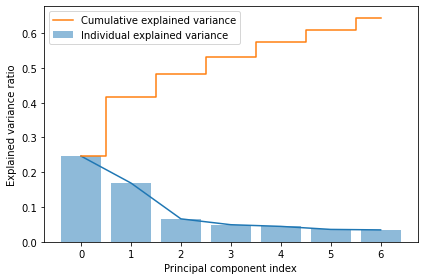

In [94]:

from sklearn.decomposition import PCA
  
pca = PCA(n_components = 7)
X = df.drop(columns=['Appliances'])

y=(df['Appliances'])

X_train, X_test, y_train, y_test = train_test_split(X,y, test_size =0.2,  random_state=5)  
X_train_scaled, X_test_scaled = do_scale(X_train,X_test)
X_train = pca.fit_transform(X_train_scaled)
X_test = pca.transform(X_test_scaled)


explained_variance = pca.explained_variance_ratio_
  
plt.plot(pca.explained_variance_ratio_)
exp_var_pca = pca.explained_variance_ratio_
cum_sum_eigenvalues = np.cumsum(exp_var_pca)
plt.bar(range(0,len(exp_var_pca)), exp_var_pca, alpha=0.5, align='center', label='Individual explained variance')
plt.step(range(0,len(cum_sum_eigenvalues)), cum_sum_eigenvalues, where='mid',label='Cumulative explained variance')
plt.ylabel('Explained variance ratio')
plt.xlabel('Principal component index')
plt.legend(loc='best')
plt.tight_layout()
plt.show()


In [95]:
pd.DataFrame(X_train)

,0,1,2,3,4,5,6
0,0.942284,-0.753995,-0.846379,2.401023,1.656295,0.555859,0.954196
1,4.487683,-0.683211,0.572921,-1.356148,3.659758,-1.388957,-1.391302
2,1.115899,-3.442565,0.207230,-1.078225,3.006001,-0.728649,1.349643
3,5.288233,0.055015,2.269835,2.091943,-0.860169,-0.355225,0.094272
4,-3.173543,-2.775111,2.537846,1.047226,0.506877,0.774030,-3.083341
...,...,...,...,...,...,...,...
15783,-4.200525,0.096260,-1.444277,2.944765,2.314223,-1.394816,-0.836437
15784,-3.642987,-1.850481,2.056017,-0.996026,-0.122692,0.799327,-1.550646
15785,0.282991,5.619739,-2.273722,2.995516,1.868192,1.710701,-0.832703
15786,3.314321,1.518958,2.554539,-0.956695,-0.221389,-0.742074,-1.216059


In [96]:
pd.DataFrame(X_test)

,0,1,2,3,4,5,6
0,-5.854641,2.960795,-2.967050,-1.445982,0.836589,-2.656886,0.666851
1,-3.552229,2.137433,1.112853,-1.684898,-0.246007,-1.290775,-1.498568
2,-4.632862,-2.164220,0.955029,-0.627271,-0.028721,0.235441,-0.140378
3,5.769764,-4.330757,-1.216350,-2.326108,-1.018891,0.019034,-2.137025
4,2.185065,-4.398831,-1.723586,1.593897,-2.481995,0.268491,0.794049
...,...,...,...,...,...,...,...
3942,0.309493,-2.526673,3.222317,-2.453071,0.636384,-0.061449,-0.333450
3943,-2.100151,0.196593,-1.638447,-0.835233,2.540290,-1.998127,-0.874116
3944,0.681976,-0.522111,0.228737,1.209673,-0.674443,0.041528,1.417046
3945,3.370739,1.317039,2.643862,-0.928407,-0.199171,-0.820464,-1.397156


In [97]:
principalDf = pd.DataFrame(data = X_train, columns = ['principal component 1', 'principal component 2','principal component 3','principal component 4','principal component 5','principal component 6','principal component 7'])
principalDf.sort_values(by='principal component 1',ascending=False)

,principal component 1,principal component 2,principal component 3,principal component 4,principal component 5,principal component 6,principal component 7
6652,8.580618,0.888048,-1.960266,-1.030981,-1.597347,0.510556,-0.865038
13650,8.573405,0.971225,-1.978261,-1.012940,-1.611790,0.533466,-0.849089
12167,8.558572,0.980646,-1.957777,-1.026580,-1.616440,0.526680,-0.879566
2381,8.548486,0.857842,-1.905755,-1.059942,-1.600925,0.486360,-0.901390
3344,8.545723,1.080086,-1.941742,-0.999356,-1.593978,0.491701,-0.864414
...,...,...,...,...,...,...,...
5656,-6.954361,-2.014367,0.338728,-0.061563,-0.658857,-2.881404,-0.465756
11132,-6.974508,-1.729613,0.414062,-0.038397,-0.612050,-2.823339,-0.529924
1184,-6.983781,-1.964731,0.402897,-0.073054,-0.629103,-2.868946,-0.484511
13911,-7.004193,-1.831922,0.400845,-0.031849,-0.617548,-2.803170,-0.456976


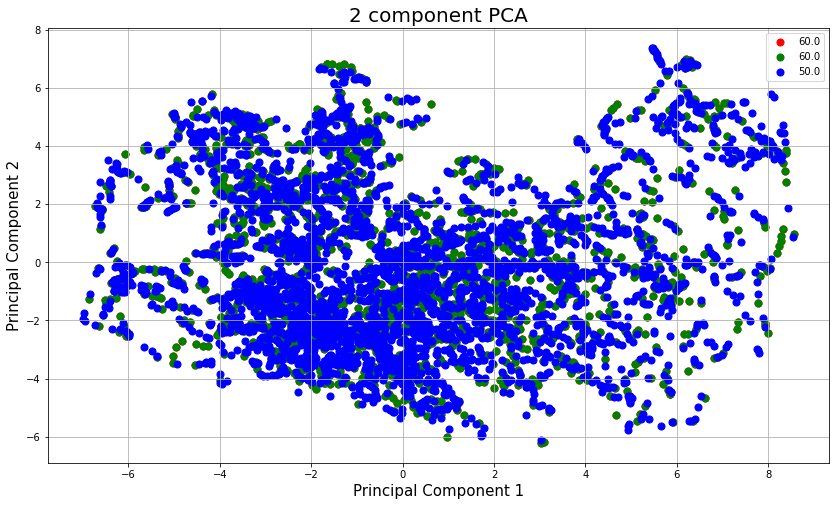

In [98]:
fig = plt.figure(figsize = (14,8))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 1', fontsize = 15)
ax.set_ylabel('Principal Component 2', fontsize = 15)
ax.set_title('2 component PCA', fontsize = 20)
targets = df['Appliances']
colors = ['r', 'g', 'b']
for target, color in zip(targets,colors):
    indicesToKeep = df['Appliances']== target
    ax.scatter(principalDf .loc[indicesToKeep, 'principal component 1']
               , principalDf .loc[indicesToKeep, 'principal component 2']
               , c = color
               , s = 50)
ax.legend(targets)
ax.grid()

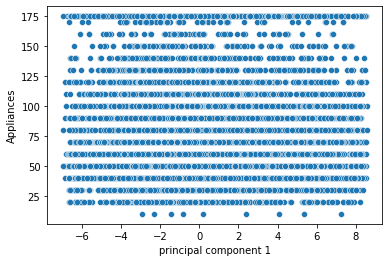

In [99]:
sns.scatterplot(data=principalDf ,x=principalDf['principal component 1'], y=df['Appliances'])

In [100]:
from sklearn.ensemble import RandomForestRegressor
  
 # create regressor object
regressor = ExtraTreesRegressor(n_estimators = 100, random_state = 42)
  
# fit the regressor with x and y data
regressor.fit(X_train, y_train)

ExtraTreesRegressor(random_state=42)

-------
Training ExtraTreesRegressor(max_features=1.0, random_state=5) ...

PredictingExtraTreesRegressor(max_features=1.0, random_state=5) scores ...


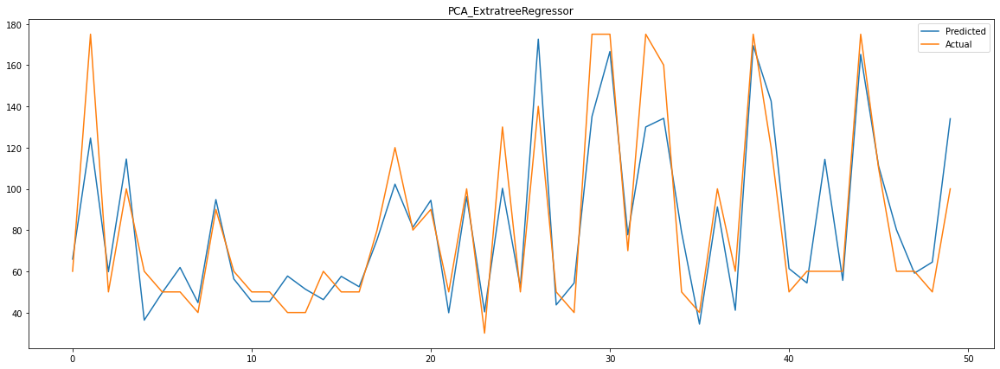


Report Updated
----------



,model_type,model_name,test_mse,test_rmse,test_mae,test_R2,test_adjusted R2,training_R2
0,Linear,Linear Regression,1360.106641,36.879624,27.660606,0.282230,0.274693,0.303539
1,Linear,Lasso Regression,1360.115140,36.879739,27.660610,0.282225,0.274689,0.303539
2,Linear,Ridge Regression,1360.833017,36.889470,27.664881,0.281846,0.274306,0.303503
3,Ensemble Method,AdaBoostRegressor,1477.036520,38.432233,30.576317,0.220522,0.212338,0.224812
4,Tree,DecisionTree Regressor,799.119584,28.268703,15.833544,0.578280,0.573852,1.000000
5,Ensemble Method,RandomForest Regressor,447.696612,21.158842,14.015341,0.763737,0.761256,0.965682
6,Ensemble Method,GradientBoosting Regressor,1024.710152,32.011094,22.952282,0.459229,0.453551,0.503818
7,Ensemble Method,ExtraTreesRegressor,399.899716,19.997493,12.890258,0.788961,0.786745,1.000000
8,Ensemble Method,XGBRegressor,416.246358,20.402116,13.215798,0.780334,0.778028,1.000000
9,Ensemble Method,Bagging Regressor,485.562072,22.035473,14.524196,0.743754,0.741063,0.950066


In [101]:
regressor = ExtraTreesRegressor(n_estimators=100, criterion='squared_error', max_depth=None, min_samples_split=2, min_samples_leaf=1, min_weight_fraction_leaf=0.0, max_features=1.0, max_leaf_nodes=None, min_impurity_decrease=0.0, bootstrap=False, oob_score=False, n_jobs=None, random_state=5, verbose=0, warm_start=False, ccp_alpha=0.0, max_samples=None)
evaluate("Ensemble Method", "PCA_ExtratreeRegressor", regressor , X_train , y_train, X_test,y_test)
display_report()

# Model with Feature Reduction

In [102]:
# Total number of features
df.describe().columns

Index(['Appliances', 'T1', 'RH_1', 'T2', 'RH_2', 'T3', 'RH_3', 'T4', 'RH_4',
       'T5', 'RH_5', 'T6', 'RH_6', 'T7', 'RH_7', 'T8', 'RH_8', 'T9', 'RH_9',
       'T_out', 'Press_mm_hg', 'RH_out', 'Windspeed', 'Visibility',
       'Tdewpoint', 'rv1', 'hour', 'day_of_month', 'day_of_week', 'month',
       'Phase_of_Day_AfterNoon', 'Phase_of_Day_Evening',
       'Phase_of_Day_Morning', 'Phase_of_Day_Night', 'day_name_Friday',
       'day_name_Monday', 'day_name_Saturday', 'day_name_Sunday',
       'day_name_Thursday', 'day_name_Tuesday', 'day_name_Wednesday',
       'month_name_April', 'month_name_February', 'month_name_January',
       'month_name_March', 'month_name_May'],
      dtype='object')

-------
Training ExtraTreesRegressor(max_features=1.0, random_state=5) ...

PredictingExtraTreesRegressor(max_features=1.0, random_state=5) scores ...


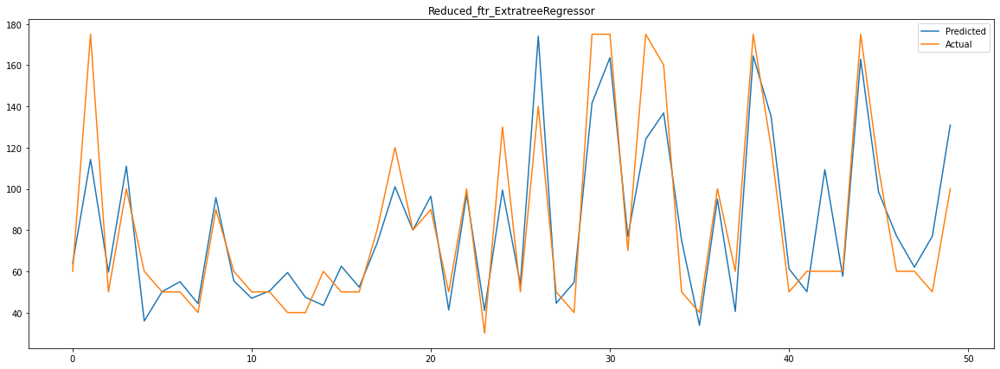


Report Updated
----------



,model_type,model_name,test_mse,test_rmse,test_mae,test_R2,test_adjusted R2,training_R2
0,Linear,Linear Regression,1360.106641,36.879624,27.660606,0.282230,0.274693,0.303539
1,Linear,Lasso Regression,1360.115140,36.879739,27.660610,0.282225,0.274689,0.303539
2,Linear,Ridge Regression,1360.833017,36.889470,27.664881,0.281846,0.274306,0.303503
3,Ensemble Method,AdaBoostRegressor,1477.036520,38.432233,30.576317,0.220522,0.212338,0.224812
4,Tree,DecisionTree Regressor,799.119584,28.268703,15.833544,0.578280,0.573852,1.000000
5,Ensemble Method,RandomForest Regressor,447.696612,21.158842,14.015341,0.763737,0.761256,0.965682
6,Ensemble Method,GradientBoosting Regressor,1024.710152,32.011094,22.952282,0.459229,0.453551,0.503818
7,Ensemble Method,ExtraTreesRegressor,399.899716,19.997493,12.890258,0.788961,0.786745,1.000000
8,Ensemble Method,XGBRegressor,416.246358,20.402116,13.215798,0.780334,0.778028,1.000000
9,Ensemble Method,Bagging Regressor,485.562072,22.035473,14.524196,0.743754,0.741063,0.950066


In [103]:
val_col = ['T1','RH_1','T2','RH_2','T3','RH_3','T4','RH_4','T5','RH_5','RH_6','T7','RH_7','T8','RH_8','RH_9','T_out','Press_mm_hg','RH_out','Windspeed','Tdewpoint','hour','Phase_of_Day_AfterNoon','Phase_of_Day_Evening','Phase_of_Day_Morning','Phase_of_Day_Night']
X= df[val_col]
y=(df['Appliances'])

X_train, X_test, y_train, y_test = train_test_split(X,y, test_size =0.2,  random_state=5)  
X_train_scaled, X_test_scaled = do_scale(X_train,X_test)

from sklearn.ensemble import ExtraTreesRegressor
  
 # create regressor object
Red_regressor = ExtraTreesRegressor(n_estimators = 300, random_state = 42)
  
# fit the regressor with x and y data
Red_regressor.fit(X_train, y_train)

from sklearn.ensemble import ExtraTreesRegressor
  
 # create regressor object
Red_regressor = ExtraTreesRegressor(n_estimators = 300, random_state = 42)
  
# fit the regressor with x and y data
Red_regressor.fit(X_train, y_train)

Red_regressor = ExtraTreesRegressor(n_estimators=100, criterion='squared_error', max_depth=None, min_samples_split=2, min_samples_leaf=1, min_weight_fraction_leaf=0.0, max_features=1.0, max_leaf_nodes=None, min_impurity_decrease=0.0, bootstrap=False, oob_score=False, n_jobs=None, random_state=5, verbose=0, warm_start=False, ccp_alpha=0.0, max_samples=None)
evaluate("Ensemble Method", "Reduced_ftr_ExtratreeRegressor", Red_regressor , X_train , y_train, X_test,y_test)
display_report()


-------
Training ExtraTreesRegressor(max_features=1.0, random_state=5) ...

PredictingExtraTreesRegressor(max_features=1.0, random_state=5) scores ...


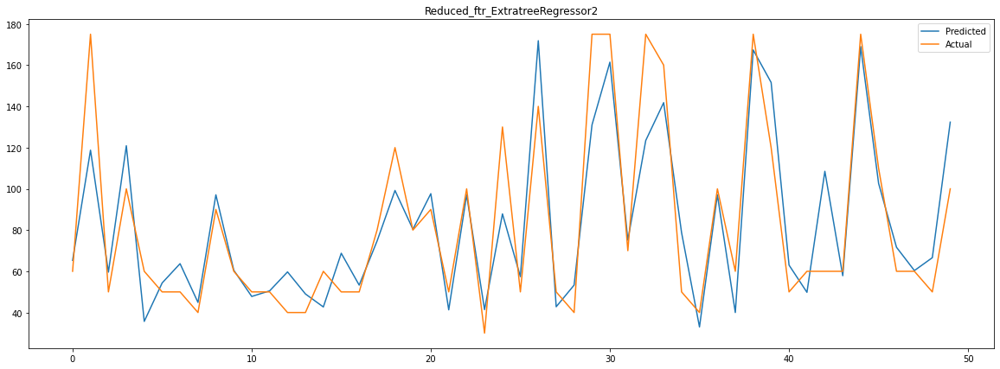


Report Updated
----------



,model_type,model_name,test_mse,test_rmse,test_mae,test_R2,test_adjusted R2,training_R2
0,Linear,Linear Regression,1360.106641,36.879624,27.660606,0.282230,0.274693,0.303539
1,Linear,Lasso Regression,1360.115140,36.879739,27.660610,0.282225,0.274689,0.303539
2,Linear,Ridge Regression,1360.833017,36.889470,27.664881,0.281846,0.274306,0.303503
3,Ensemble Method,AdaBoostRegressor,1477.036520,38.432233,30.576317,0.220522,0.212338,0.224812
4,Tree,DecisionTree Regressor,799.119584,28.268703,15.833544,0.578280,0.573852,1.000000
5,Ensemble Method,RandomForest Regressor,447.696612,21.158842,14.015341,0.763737,0.761256,0.965682
6,Ensemble Method,GradientBoosting Regressor,1024.710152,32.011094,22.952282,0.459229,0.453551,0.503818
7,Ensemble Method,ExtraTreesRegressor,399.899716,19.997493,12.890258,0.788961,0.786745,1.000000
8,Ensemble Method,XGBRegressor,416.246358,20.402116,13.215798,0.780334,0.778028,1.000000
9,Ensemble Method,Bagging Regressor,485.562072,22.035473,14.524196,0.743754,0.741063,0.950066


In [104]:
val_col1 = ['T1','T2','T3','T4','T5','RH_6','T7','T8','RH_8','RH_9','T_out','RH_out','hour','Phase_of_Day_AfterNoon','Phase_of_Day_Evening','Phase_of_Day_Night','month_name_January']
X= df[val_col1]
y=(df['Appliances'])

X_train, X_test, y_train, y_test = train_test_split(X,y, test_size =0.2,  random_state=5)  
X_train_scaled, X_test_scaled = do_scale(X_train,X_test)

from sklearn.ensemble import ExtraTreesRegressor
  
 # create regressor object
Red_regressor1 = ExtraTreesRegressor(n_estimators = 300, random_state = 42)
  
# fit the regressor with x and y data
Red_regressor1.fit(X_train, y_train)

from sklearn.ensemble import ExtraTreesRegressor
  
 # create regressor object
Red_regressor1 = ExtraTreesRegressor(n_estimators = 300, random_state = 42)
  
# fit the regressor with x and y data
Red_regressor1.fit(X_train, y_train)

Red_regressor1 = ExtraTreesRegressor(n_estimators=100, criterion='squared_error', max_depth=None, min_samples_split=2, min_samples_leaf=1, min_weight_fraction_leaf=0.0, max_features=1.0, max_leaf_nodes=None, min_impurity_decrease=0.0, bootstrap=False, oob_score=False, n_jobs=None, random_state=5, verbose=0, warm_start=False, ccp_alpha=0.0, max_samples=None)
evaluate("Ensemble Method", "Reduced_ftr_ExtratreeRegressor2", Red_regressor1 , X_train , y_train, X_test,y_test)
display_report()

Text(0.5, 1.0, 'Testing RMSE comparision with all models')

<Figure size 720x360 with 0 Axes>

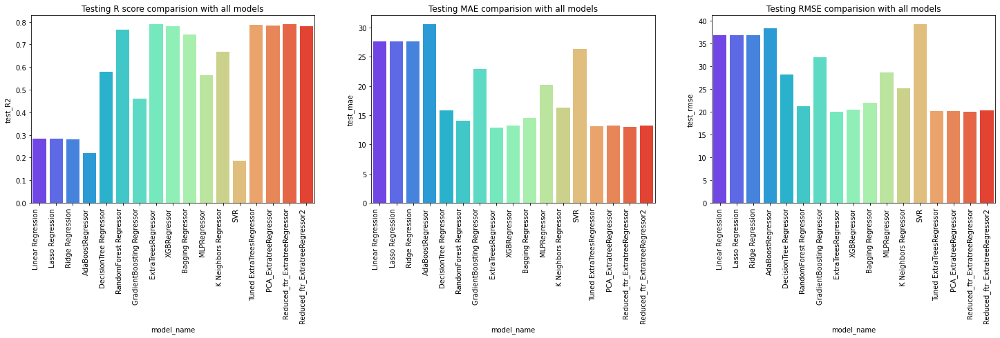

In [105]:
final_report = display_report()
plt.figure(figsize=(10,5))
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(25, 5))
ax = axes.flatten()
plt.xticks(rotation = 90)
sns.barplot(x = final_report['model_name'], y = final_report['test_R2'], palette = 'rainbow', ax=ax[0])
ax[0].set_xticklabels( final_report['model_name'], rotation=90, ha='right')
sns.barplot(x = final_report['model_name'], y = final_report['test_mae'], palette = 'rainbow', ax=ax[1])
ax[1].set_xticklabels( final_report['model_name'], rotation=90, ha='right')
sns.barplot(x = final_report['model_name'], y = final_report['test_rmse'], palette = 'rainbow', ax=ax[2])
plt.xticks(rotation = 90)
ax[0].set_title('Testing R score comparision with all models')
ax[1].set_title('Testing MAE comparision with all models')
ax[2].set_title('Testing RMSE comparision with all models')

Tuned Extra Tree Regressor Model with hour,'T1','RH_1','T2','RH_2','T3','RH_3','T4','RH_4','T5','RH_5','RH_6','T7','RH_7','T8','RH_8','RH_9','T_out','Press_mm_hg','RH_out','Windspeed' ,'Tdewpoint' variables have maximum R2 score after hyper parameter tuning and Less MAE, RMSE.

# **Limitations**


One of the main limitations of this study is that the analysis was
done for only one house. Important information could be found
when analyzing several houses, and other relationships can be
studied with appliances’ energy consumption in combination with:
occupant’s age, number of occupants, ownership of pets, building’s
geometry etc. Another research limitation is the length of continuous analyzed data. Different energy use patterns can potentially be
found depending on the season of the year. Regarding the weather
station, the predictions of appliances energy use could probably be
better if the weather station was closer to the house. This research
has not looked into the problem of optimal location of the wireless
indoor sensors for improvement of the energy prediction. It is also
possible that more sensors and better sensor accuracy could help
to improve the energy prediction.

# **Conclusion**

1. The household appliance energy  consumption prediction models based on Linear Regression, Lasso Regression, Ridge Regression, MLP Regressor,XGBoost,DecisionTree Regressor Random Forest Regressor, Adaptive Boosting Regressor, Gradient Boosting Regressor, Bagging Regressor, K Neighbors Regressor and Linear SVM are explored.
2. Upon appropriate preprocessing and fitting the fourteen models, we compare and evaluate the best model with lowest error and the highest R-squared score.
3. The variables T6 and T_out , T9 and T7 has high correlation with each other hence we have dropped T6 and T9. When evaluating the influence of Random Variable attribute the linear models have assigned near zero weights to the random variable, negating its influence in prediction of the target variable.
4. Extra Tree Regressor was found to be the best performing model with an R-squared score of 0.7891.
5. After optimizing the hyperparameters of the Extra Tree Regressor,doing principle Component Analysis, its R-squared score increased from 0.7889 to 0.7891.
6. We find that this model’s predictions are mainly contributed by the 'T1', 'T2', 'T3', 'T4', 'T5','RH_6', 'T7', 'T8', 'RH_8','RH_9', 'T_out', 'RH_out', 'hour', 'Phase_of_Day_AfterNoon', 'Phase_of_Day_Evening', 'Phase_of_Day_Night','month_name_January' Temparature and Relative Humidity of kitchen, living room, laundry room, Ironing room, outside surrounding are playing important role in Energy Prediction.
7. Data from a wireless sensor network that measures humidity and temperature has been proven to increase the prediction accuracy. The data analysis showed that data from the kitchen, laundry room, living room and bathrooms had the most important contributions. Data from the other rooms also helps in the prediction. When looking at the appliances in each room , it can be seen that the laundry, kitchen and living rooms would be expected to have the highest contributions because of the equipment present. The prediction of appliances’ consumption with data from the wireless network indicates that it can help to locate where in a building the main appliances’ energy consumption contributions are found.
8. When using all the predictors the light consumption was ranked highly. However, when studying different predictor subsets, removing the light consumption appeared not to have a significant impact. This may be an indication that other features are correlated well with the light energy consumption.
9. The possible explanation for why the pressure has a strong prediction power may be related to its influence on the wind speed and higher rainfall probability which could potentially increase the occupancy of the house.
10. As this dataset has a time component to it, we believe that better performances can be achieved by using Time Series Analysis concepts.



# **Future Scope and Suggestions**

This study has found curious relationships between variables. Future work could include considering weather data such as solar radiation and precipitation. Also occupancy and occupant’s activity information could be useful to improve the prediction and find its relationship with other parameters (exterior weather for example). The wireless sensors could also measure CO2 and noise to help in the prediction and to track the occupant’s movement from room to room and time spent in each room. We Could try NN regressor to analyze the pattern of the data for prediction. Dataset should have the More features to interpret the appliances energy consumption like list of appliances with per hour watt energy consumption.  


# **References**

1. https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LinearRegression.html

2. https://scikit-learn.org/stable/modules/linear_model.html

3. https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestRegressor.html
